<a href="https://colab.research.google.com/github/ashikha-03/Heart-disease-prediction/blob/main/Heart_disease_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

7/7 [==============================] - 0s 1ms/step
Final Accuracy: 0.99
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       102
           1       1.00      0.97      0.99       103

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



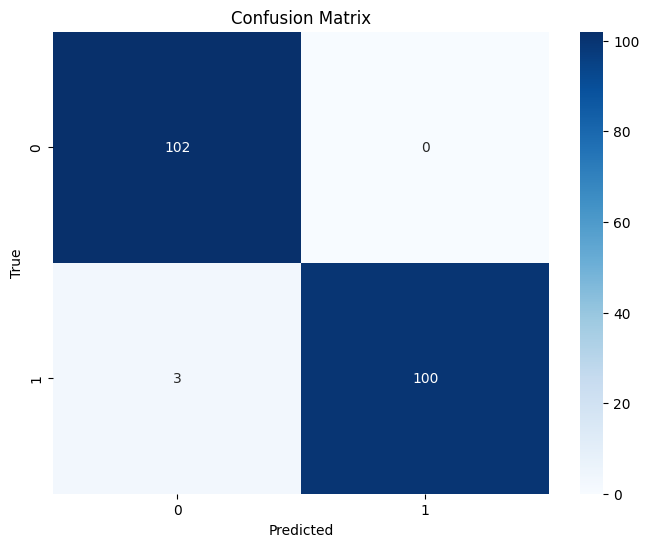

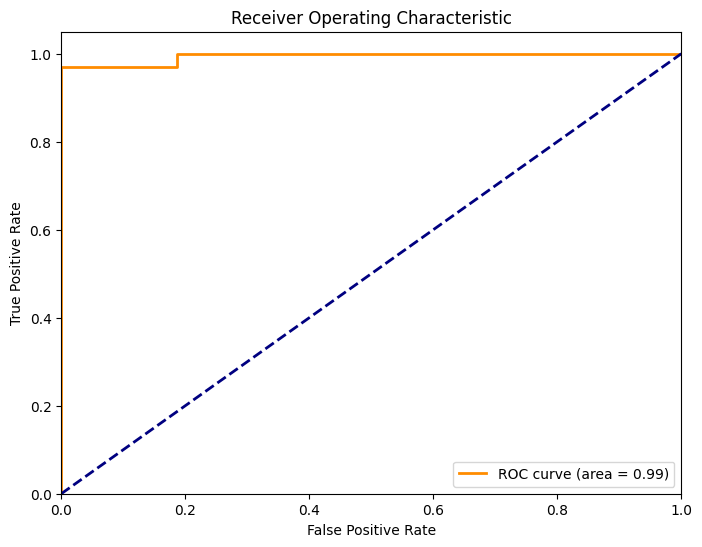

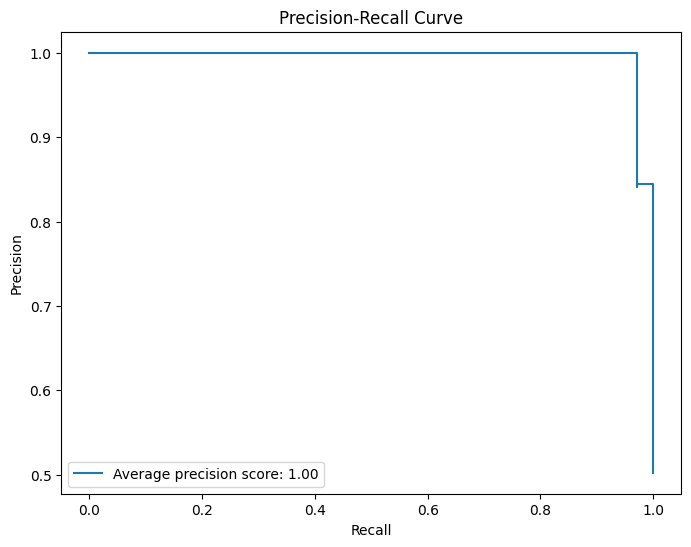

7/7 [==============================] - 0s 2ms/step


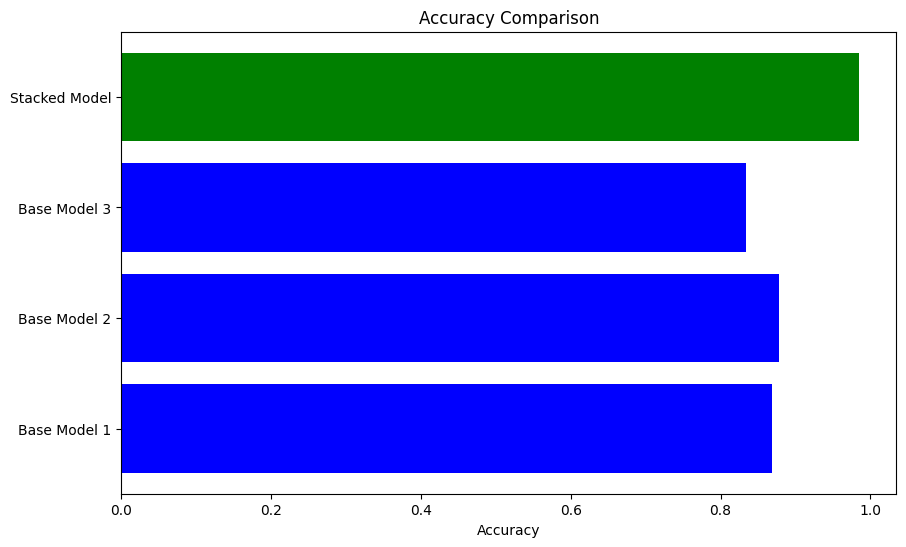

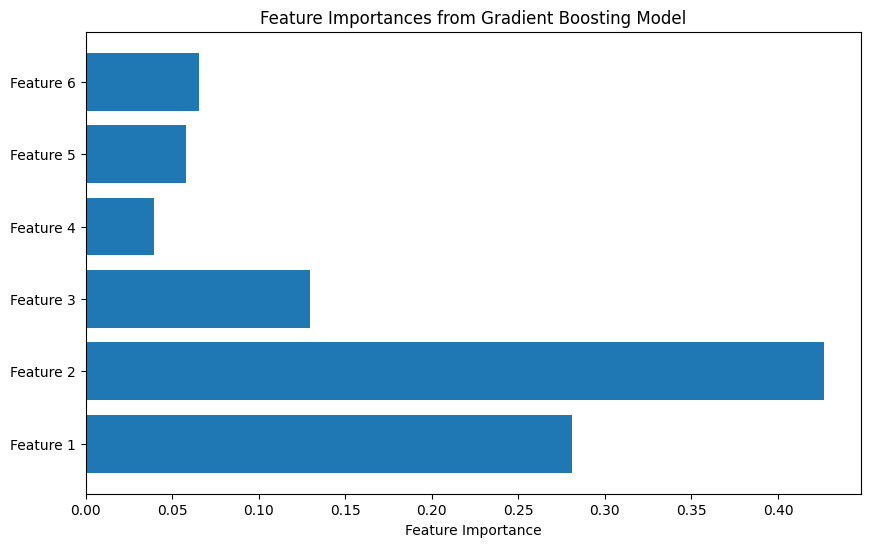

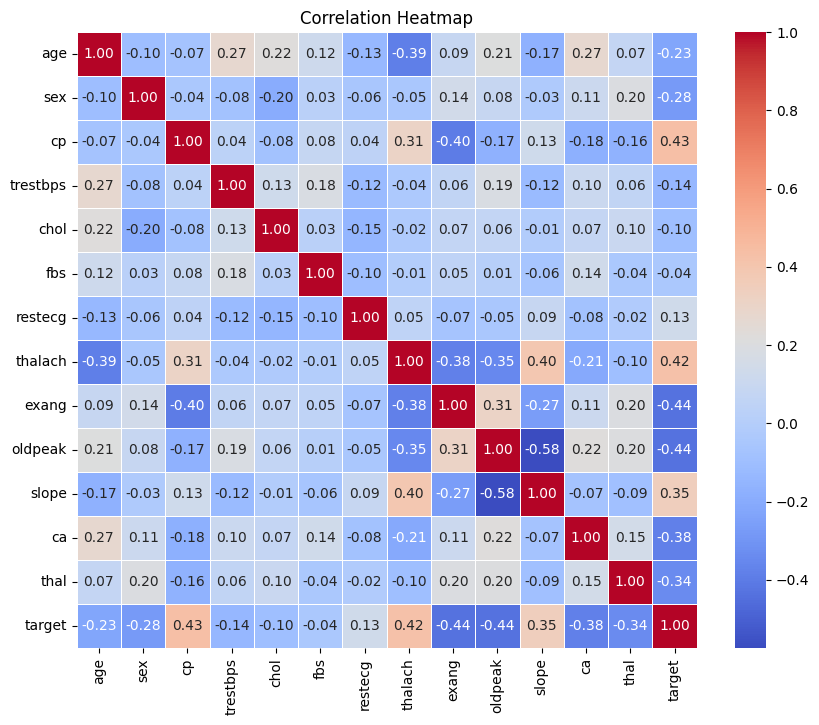

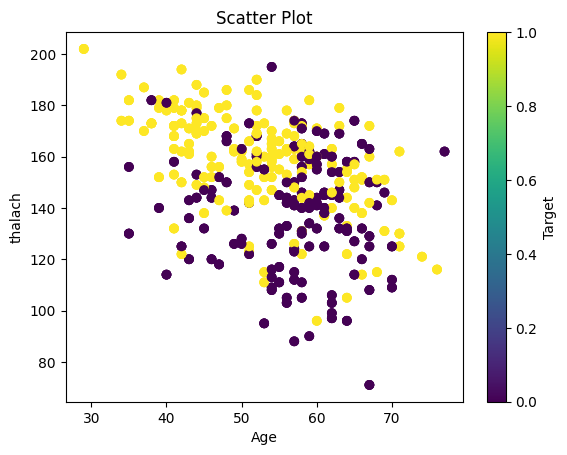

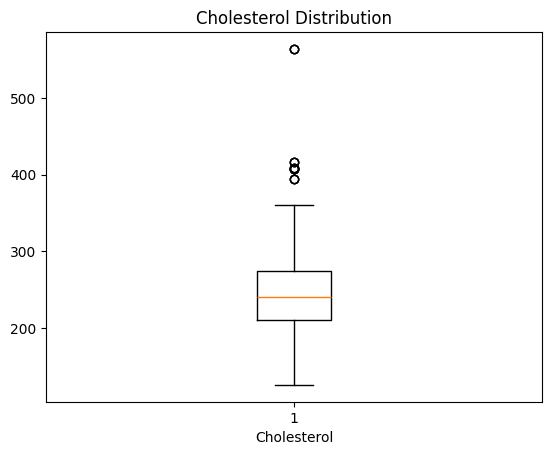

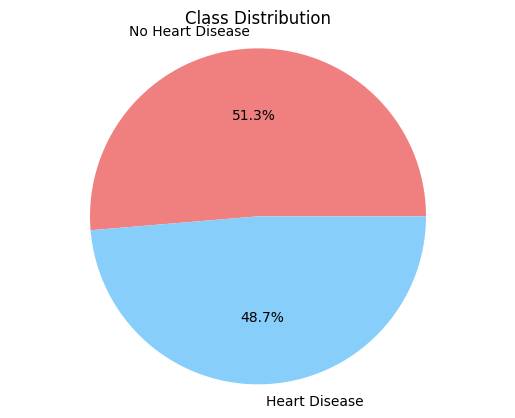

<ipython-input-2-3faf0fa28e7e>:166: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['age'], shade=True, color="r")


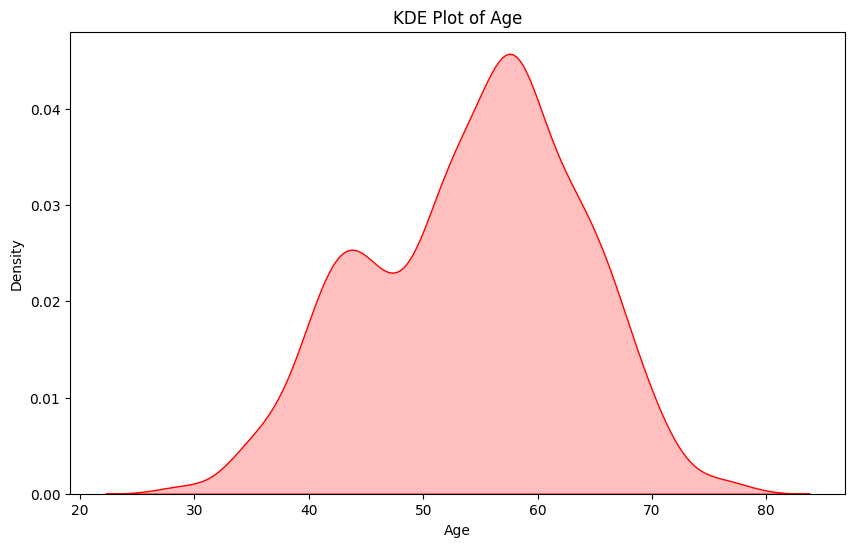

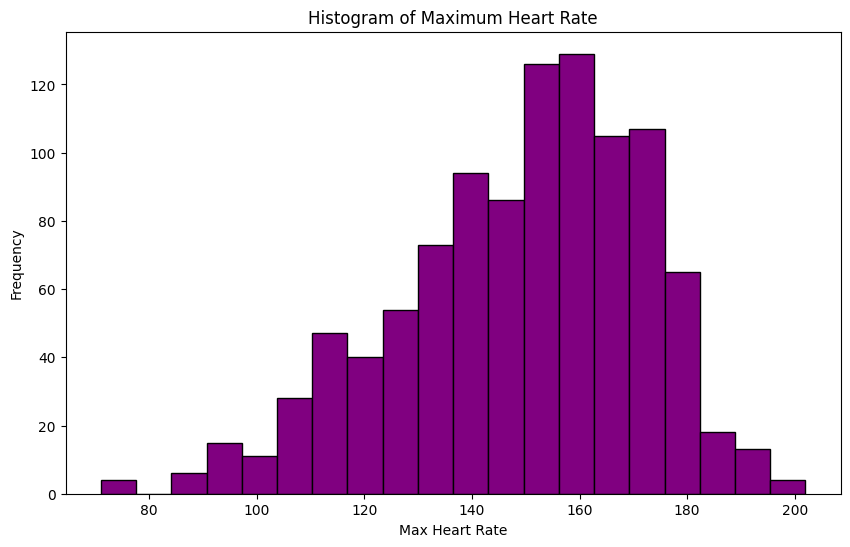

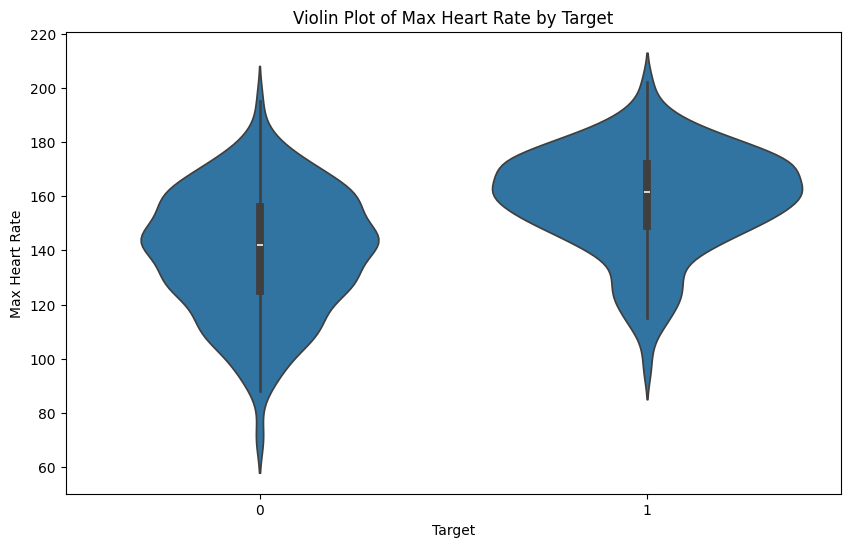

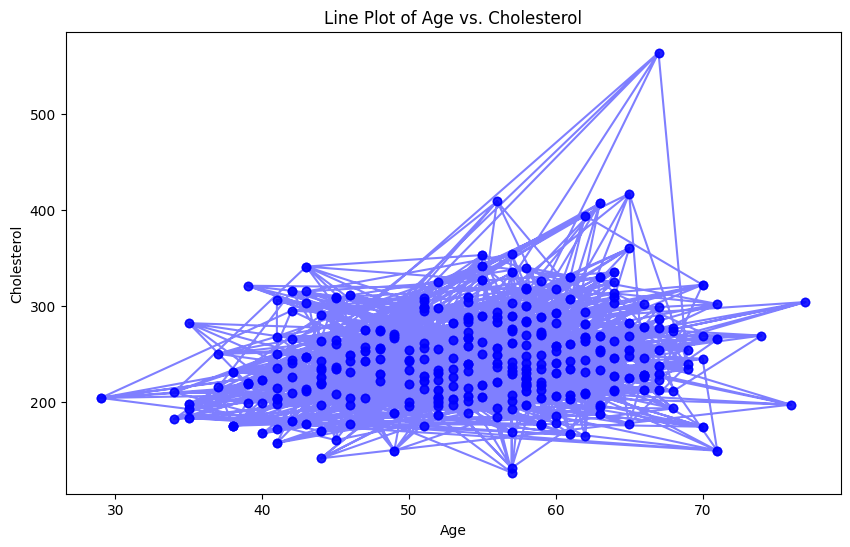

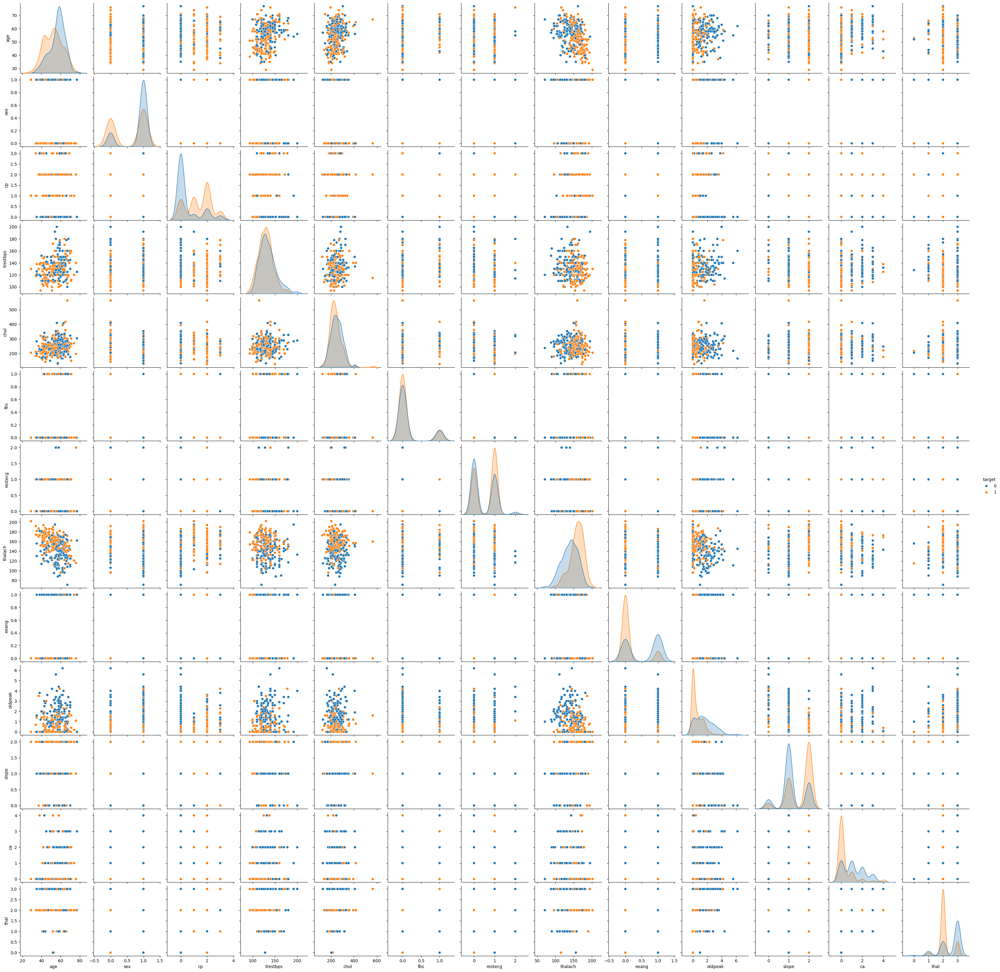

...

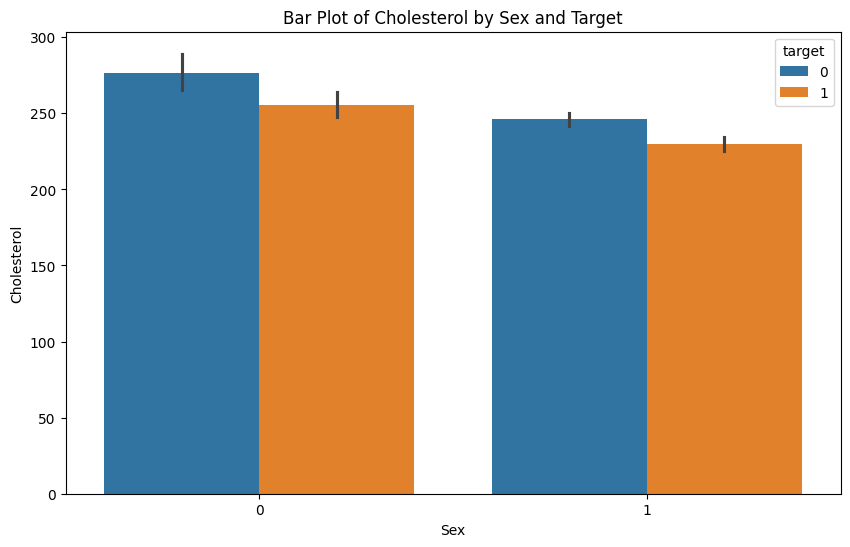

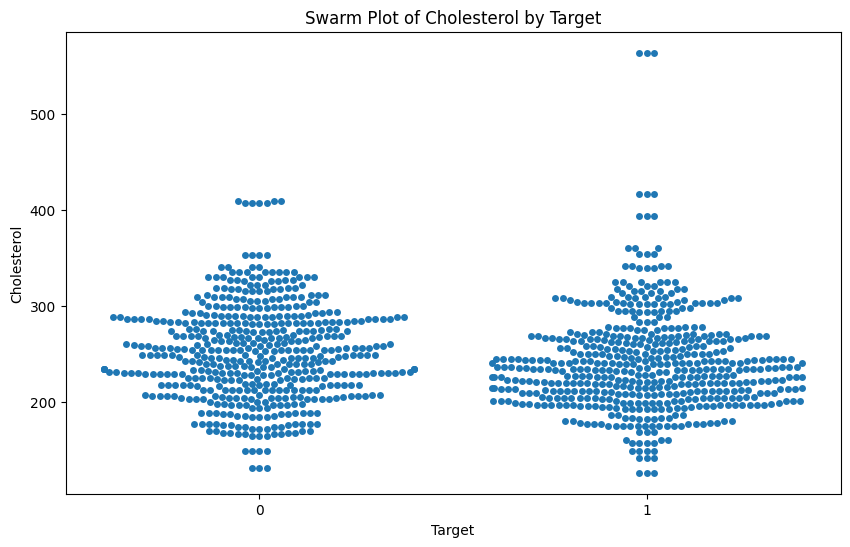

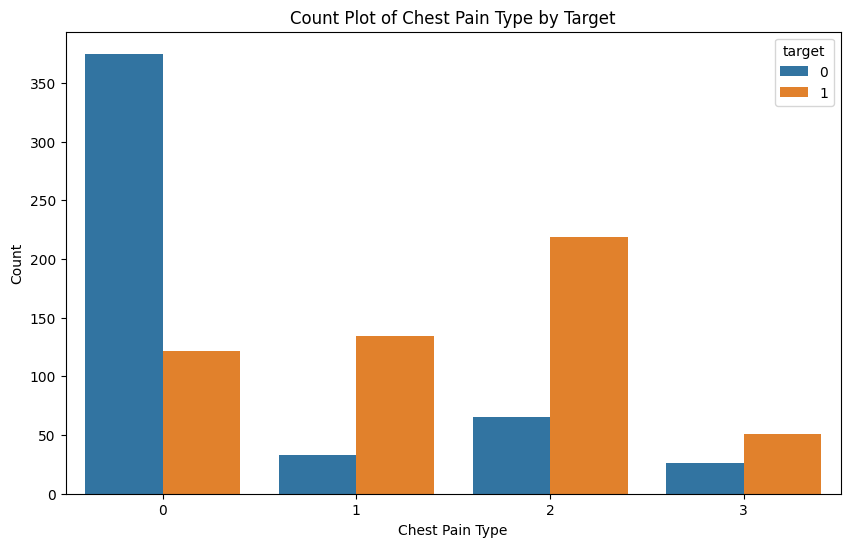

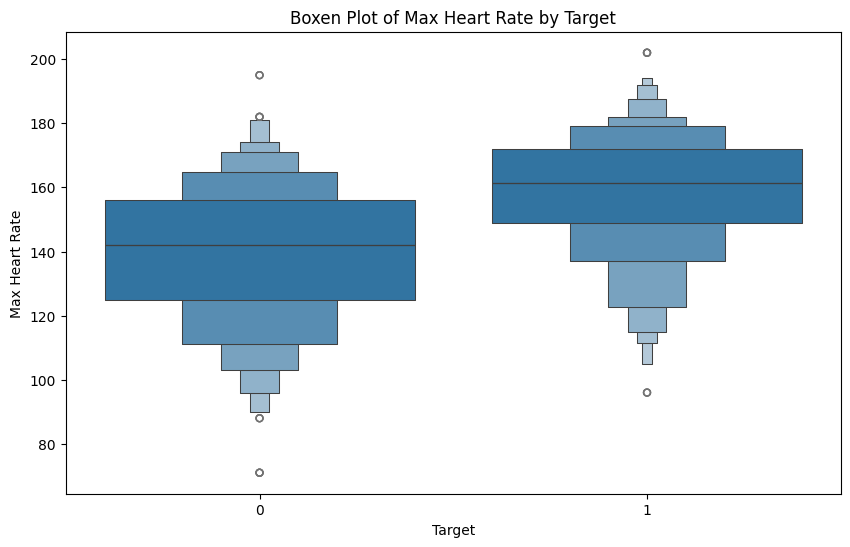

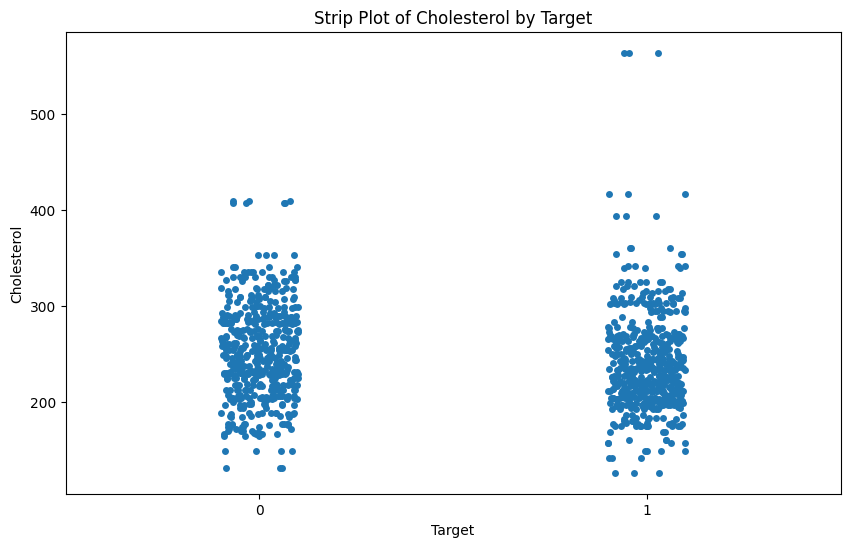

<ipython-input-2-3faf0fa28e7e>:262: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])


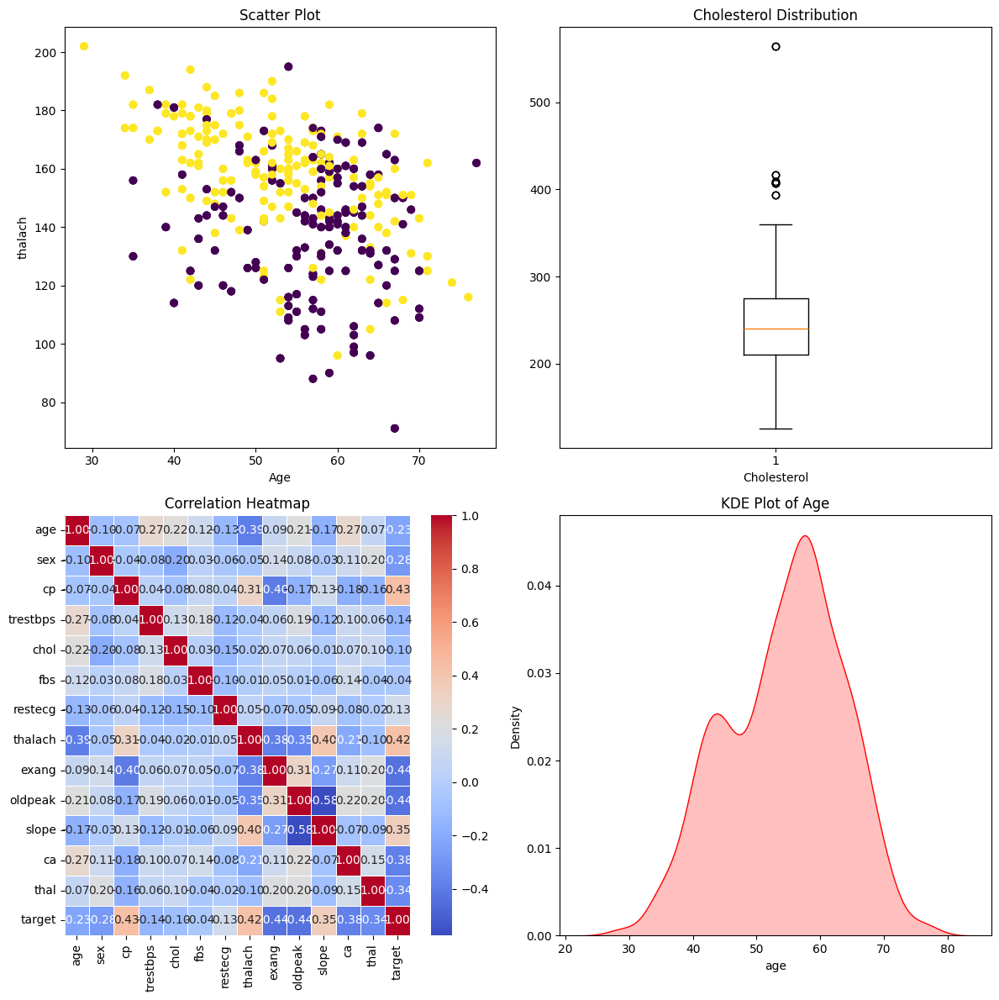

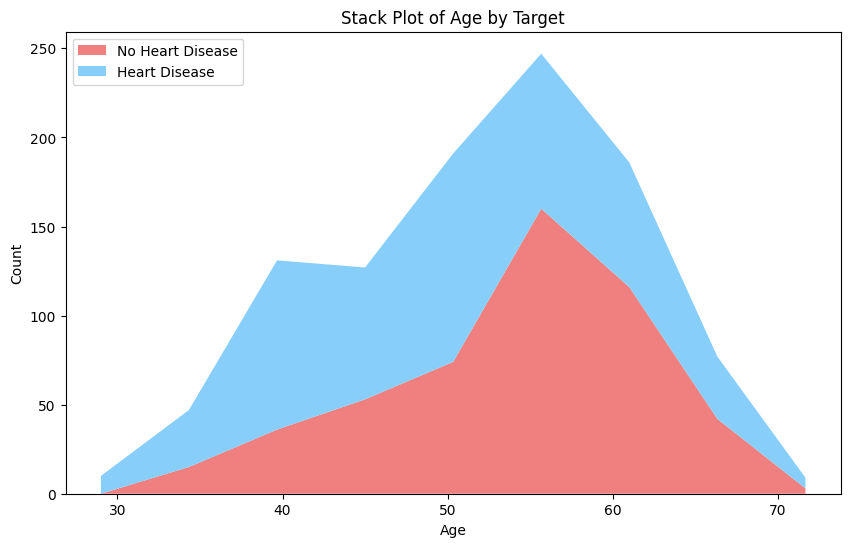

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report

# Load the dataset
data = pd.read_csv('/content/heart.csv')

# Select relevant columns
columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
data = data[columns]

# Handle missing values if any (for simplicity, we'll drop rows with missing values)
data = data.dropna()


# Split the data into features (X) and target (y)
X = data.drop('target', axis=1)
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert labels to categorical one-hot encoding
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Function to build base models
def build_base_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define base models
base_models = [build_base_model(X_train.shape[1]) for _ in range(3)]

# Train base models and get predictions for the second level
first_level_predictions_train = np.zeros((X_train.shape[0], len(base_models) * 2))  # 2 for each class
first_level_predictions_test = np.zeros((X_test.shape[0], len(base_models) * 2))

for i, model in enumerate(base_models):
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0, validation_split=0.2)
    first_level_predictions_train[:, 2*i:2*i+2] = model.predict(X_train)
    first_level_predictions_test[:, 2*i:2*i+2] = model.predict(X_test)

# Prepare the targets for second level
y_train_second_level = np.argmax(y_train, axis=1)
y_test_second_level = np.argmax(y_test, axis=1)

# Define and train the second level model (GBM)
second_level_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
second_level_model.fit(first_level_predictions_train, y_train_second_level)

# Evaluate the model
final_predictions = second_level_model.predict(first_level_predictions_test)
final_accuracy = accuracy_score(y_test_second_level, final_predictions)
print(f'Final Accuracy: {final_accuracy:.2f}')

# Classification Report
print('Classification Report:')
print(classification_report(y_test_second_level, final_predictions))

# Confusion Matrix
cm = confusion_matrix(y_test_second_level, final_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
average_precision = average_precision_score(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average precision score: {average_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Accuracy Comparison Plot
base_accuracies = [accuracy_score(np.argmax(y_test, axis=1), np.argmax(model.predict(X_test), axis=1)) for model in base_models]
base_names = ['Base Model 1', 'Base Model 2', 'Base Model 3']
all_accuracies = base_accuracies + [final_accuracy]
all_names = base_names + ['Stacked Model']

plt.figure(figsize=(10, 6))
plt.barh(all_names, all_accuracies, color=['blue', 'blue', 'blue', 'green'])
plt.xlabel('Accuracy')
plt.title('Accuracy Comparison')
plt.show()

# Feature Importances (for Gradient Boosting Model)
feature_importances = second_level_model.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(range(len(feature_importances)), feature_importances, align='center')
plt.yticks(range(len(feature_importances)), ['Feature ' + str(i+1) for i in range(len(feature_importances))])
plt.xlabel('Feature Importance')
plt.title('Feature Importances from Gradient Boosting Model')
plt.show()

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# Scatter Plot
plt.figure()
plt.scatter(data['age'], data['thalach'], c=data['target'], cmap='viridis')
plt.xlabel('Age')
plt.ylabel('thalach')
plt.title('Scatter Plot')
plt.colorbar(label='Target')
plt.show()

# Box Plot
plt.figure()
plt.boxplot(data['chol'])
plt.xlabel('Cholesterol')
plt.title('Cholesterol Distribution')
plt.show()

# Pie Chart
plt.figure()
plt.pie(data['target'].value_counts(), labels=['No Heart Disease', 'Heart Disease'], autopct='%1.1f%%', colors=['lightcoral', 'lightskyblue'])
plt.title('Class Distribution')
plt.axis('equal')
plt.show()

# KDE Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(data['age'], shade=True, color="r")
plt.title('KDE Plot of Age')
plt.xlabel('Age')
plt.show()

# Histogram
plt.figure(figsize=(10, 6))
plt.hist(data['thalach'], bins=20, color='purple', edgecolor='black')
plt.title('Histogram of Maximum Heart Rate')
plt.xlabel('Max Heart Rate')
plt.ylabel('Frequency')
plt.show()

# Violin Plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='target', y='thalach', data=data)
plt.title('Violin Plot of Max Heart Rate by Target')
plt.xlabel('Target')
plt.ylabel('Max Heart Rate')
plt.show()

# Line Plot (example: age vs. cholesterol)
plt.figure(figsize=(10, 6))
plt.plot(data['age'], data['chol'], 'bo', linestyle='-', alpha=0.5)
plt.title('Line Plot of Age vs. Cholesterol')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.show()

# Pair Plot
sns.pairplot(data, hue='target')
plt.show()

# Joint Plot
sns.jointplot(x='age', y='thalach', data=data, kind='scatter', hue='target')
plt.show()

# Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='sex', y='chol', hue='target', data=data)
plt.title('Bar Plot of Cholesterol by Sex and Target')
plt.xlabel('Sex')
plt.ylabel('Cholesterol')
plt.show()

# Swarm Plot
plt.figure(figsize=(10, 6))
sns.swarmplot(x='target', y='chol', data=data)
plt.title('Swarm Plot of Cholesterol by Target')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.show()

# Count Plot
plt.figure(figsize=(10, 6))
sns.countplot(x='cp', hue='target', data=data)
plt.title('Count Plot of Chest Pain Type by Target')
plt.xlabel('Chest Pain Type')
plt.ylabel('Count')
plt.show()

# Boxen Plot
plt.figure(figsize=(10, 6))
sns.boxenplot(x='target', y='thalach', data=data)
plt.title('Boxen Plot of Max Heart Rate by Target')
plt.xlabel('Target')
plt.ylabel('Max Heart Rate')
plt.show()

# Strip Plot
plt.figure(figsize=(10, 6))
sns.stripplot(x='target', y='chol', data=data, jitter=True)
plt.title('Strip Plot of Cholesterol by Target')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.show()

# Grid Plot
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Scatter Plot
axs[0, 0].scatter(data['age'], data['thalach'], c=data['target'], cmap='viridis')
axs[0, 0].set_xlabel('Age')
axs[0, 0].set_ylabel('thalach')
axs[0, 0].set_title('Scatter Plot')

# Box Plot
axs[0, 1].boxplot(data['chol'])
axs[0, 1].set_xlabel('Cholesterol')
axs[0, 1].set_title('Cholesterol Distribution')

# Heatmap
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap')

# KDE Plot
sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])
axs[1, 1].set_title('KDE Plot of Age')

plt.tight_layout()
plt.show()

# Stack Plot (using binned data)
age_bins = np.linspace(data['age'].min(), data['age'].max(), 10)
no_disease_counts, _ = np.histogram(data[data['target'] == 0]['age'], bins=age_bins)
disease_counts, _ = np.histogram(data[data['target'] == 1]['age'], bins=age_bins)

plt.figure(figsize=(10, 6))
plt.stackplot(age_bins[:-1], no_disease_counts, disease_counts, labels=['No Heart Disease', 'Heart Disease'], colors=['lightcoral', 'lightskyblue'])
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Stack Plot of Age by Target')
plt.legend(loc='upper left')
plt.show()


Logistic Regression Accuracy: 0.80
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       102
           1       0.76      0.87      0.81       103

    accuracy                           0.80       205
   macro avg       0.80      0.79      0.79       205
weighted avg       0.80      0.80      0.79       205



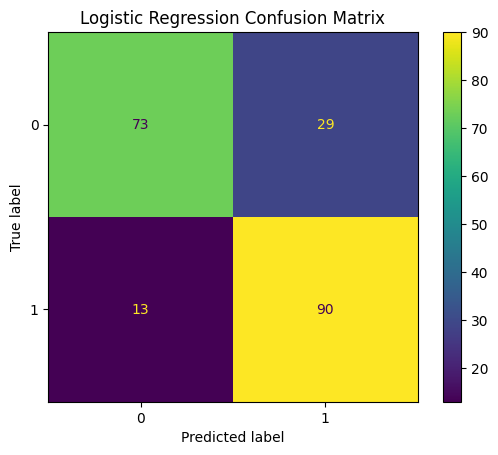

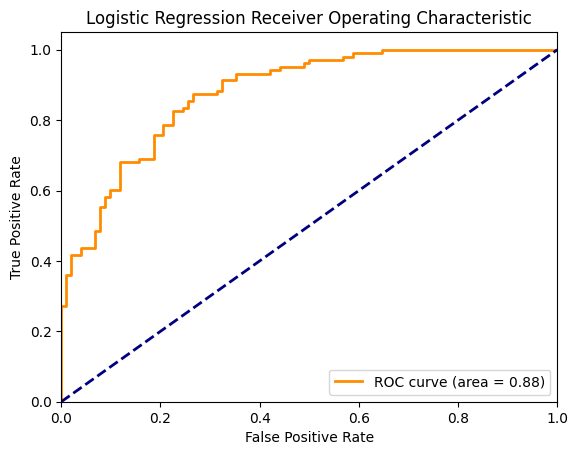

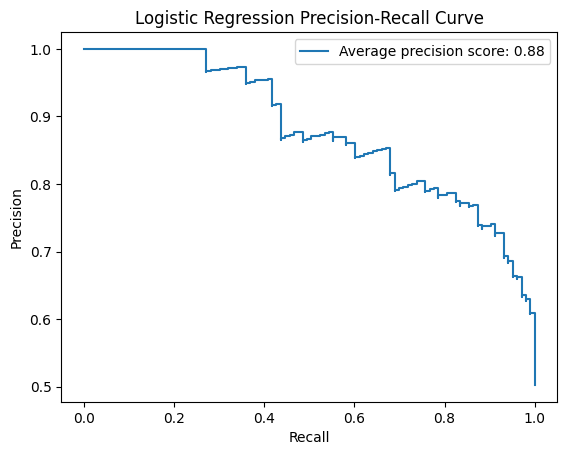

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


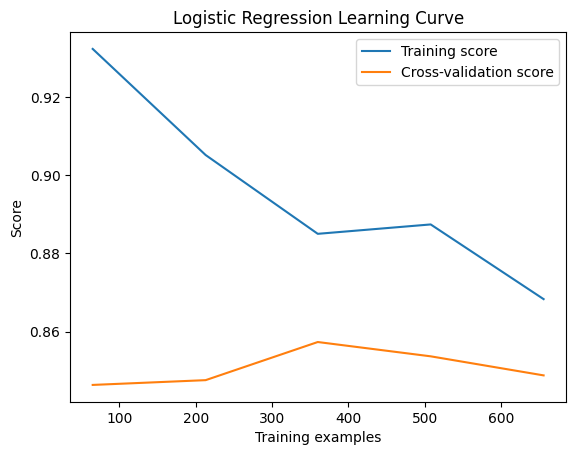

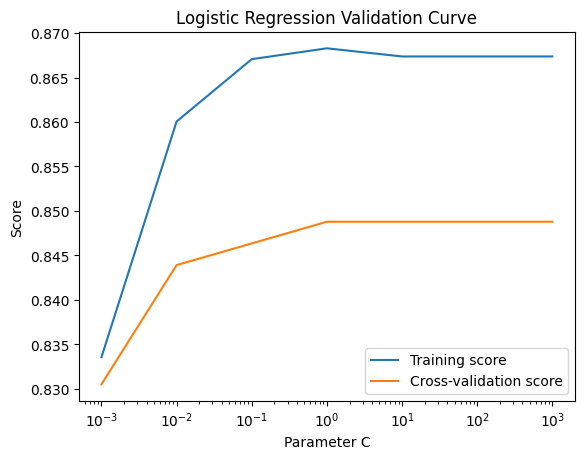

Decision Tree Accuracy: 0.99
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       102
           1       1.00      0.97      0.99       103

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



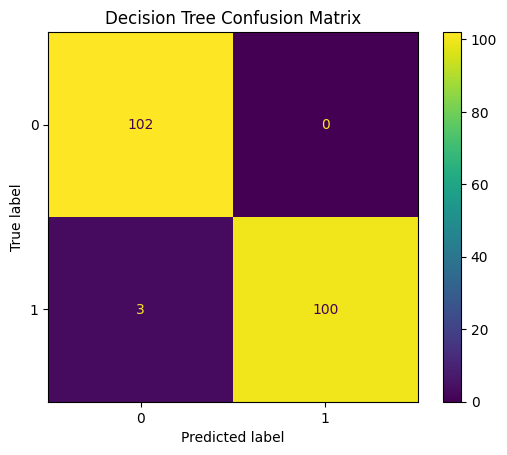

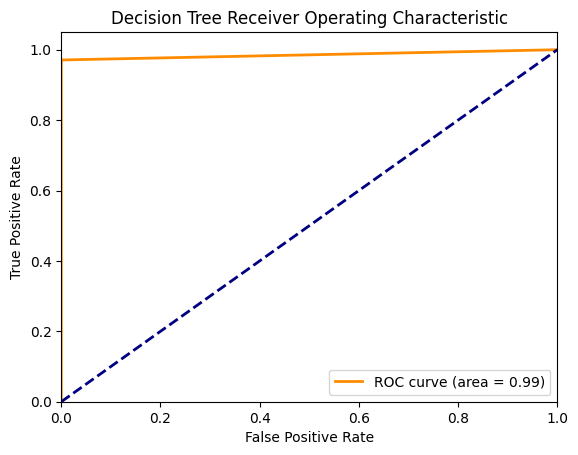

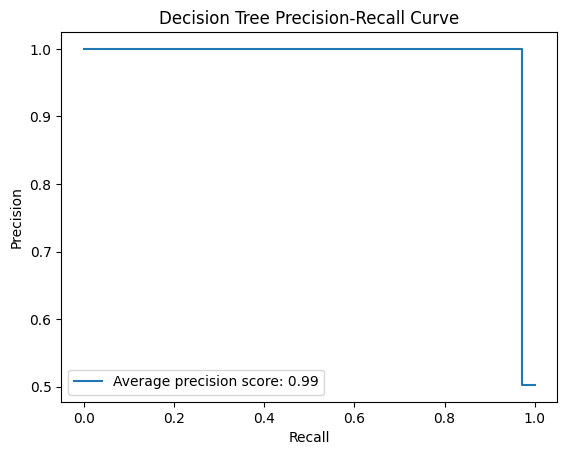

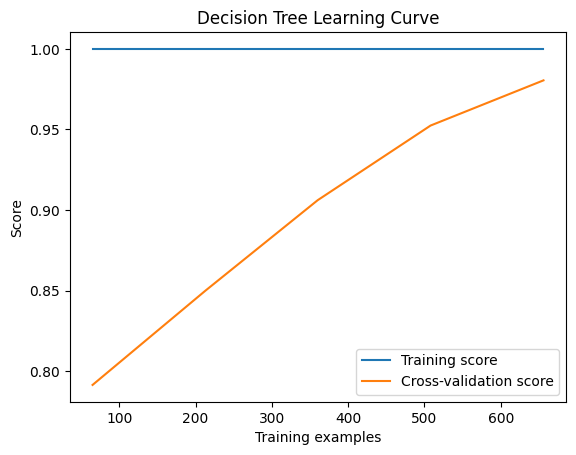

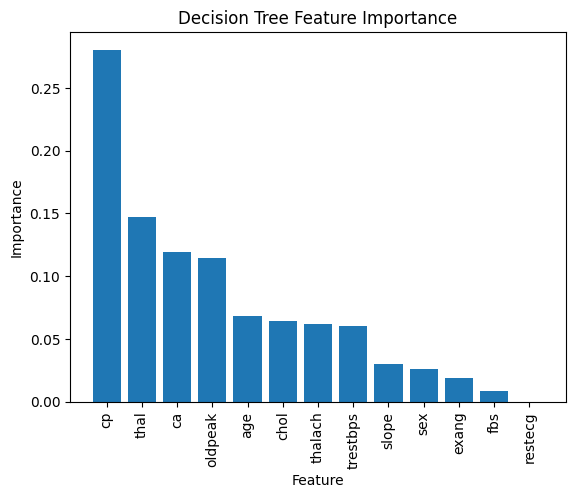

Random Forest Accuracy: 0.99
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       102
           1       1.00      0.97      0.99       103

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



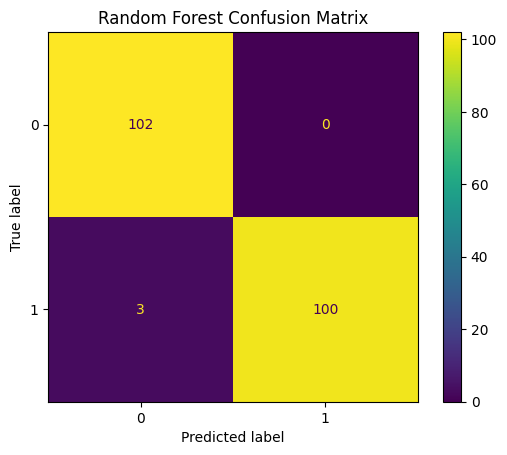

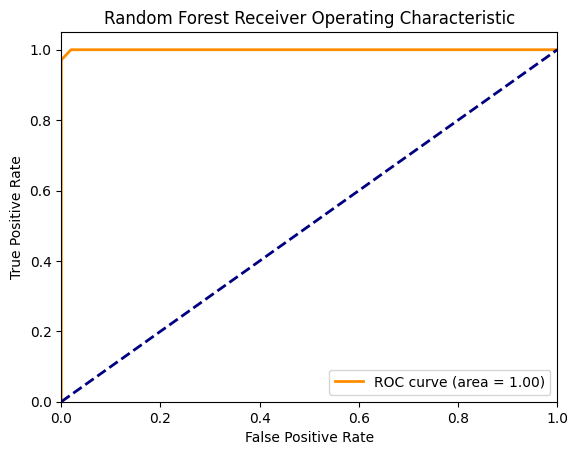

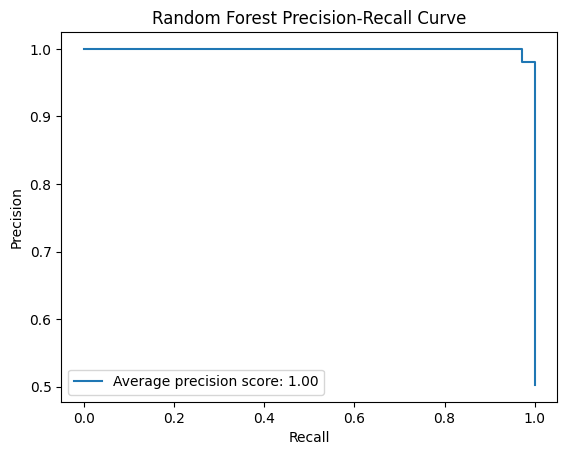

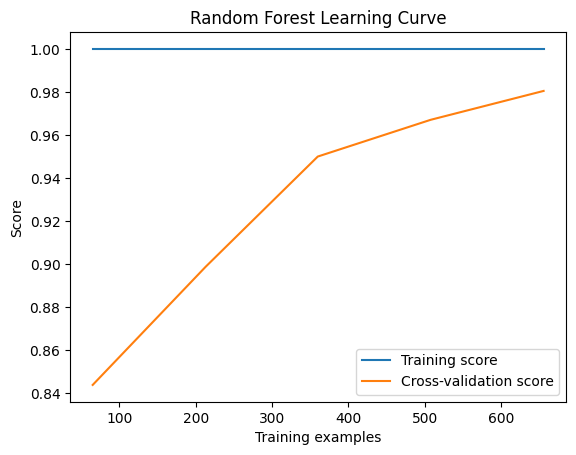

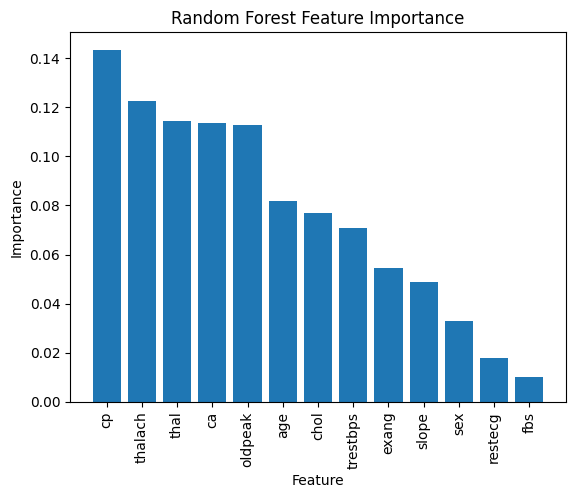

Gradient Boosting Accuracy: 0.93
Gradient Boosting Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       102
           1       0.92      0.95      0.93       103

    accuracy                           0.93       205
   macro avg       0.93      0.93      0.93       205
weighted avg       0.93      0.93      0.93       205



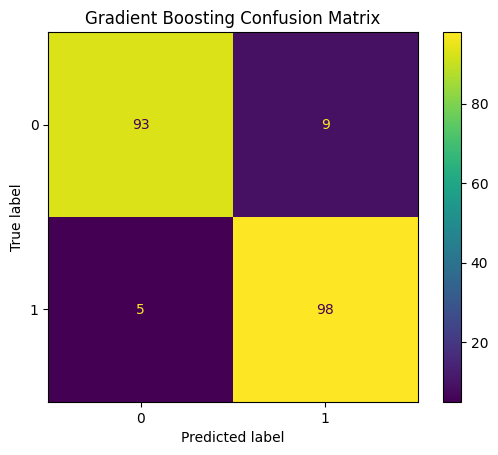

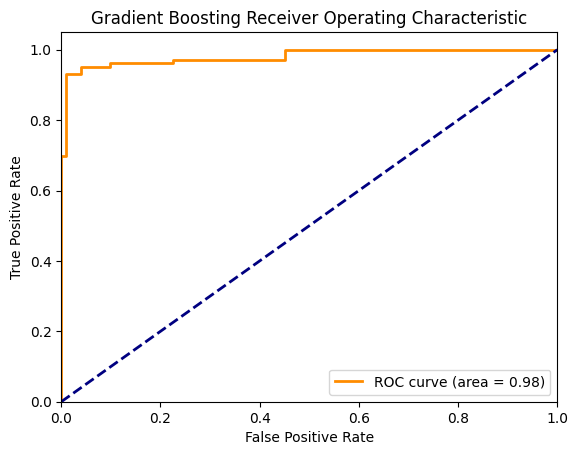

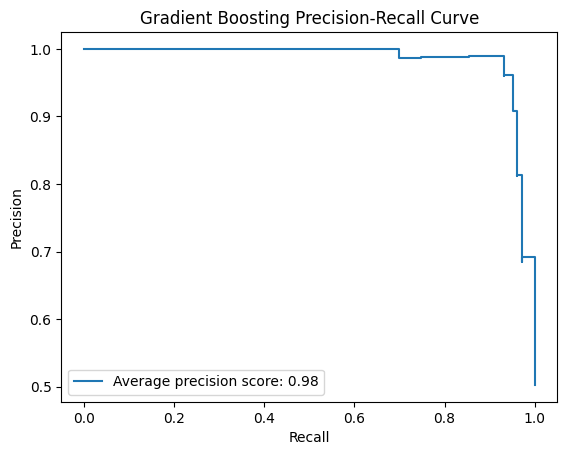

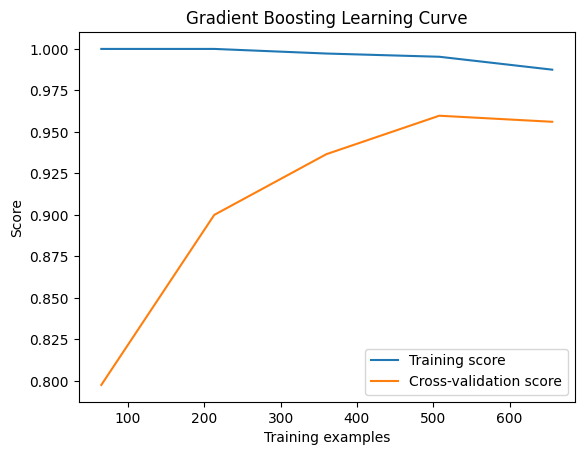

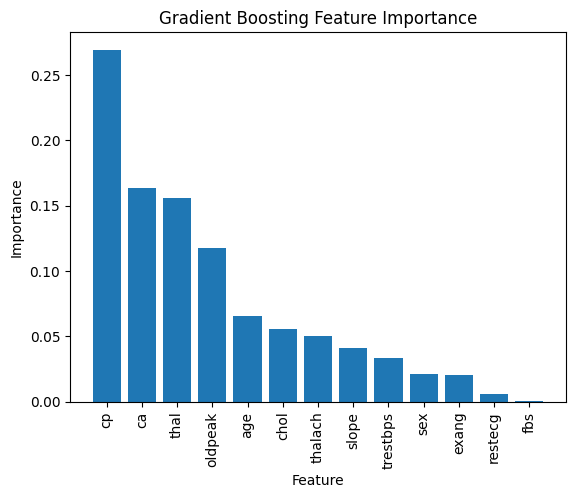

SVC Accuracy: 0.89
SVC Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.83      0.88       102
           1       0.85      0.94      0.89       103

    accuracy                           0.89       205
   macro avg       0.89      0.89      0.89       205
weighted avg       0.89      0.89      0.89       205



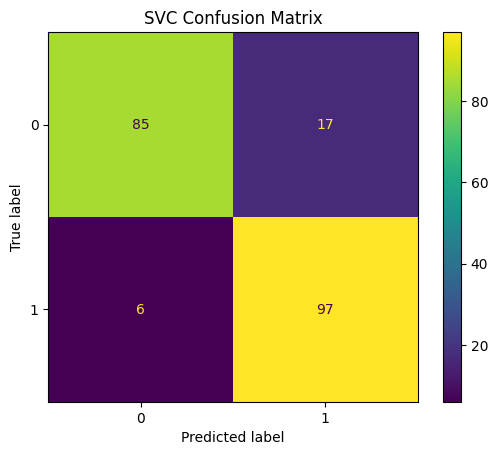

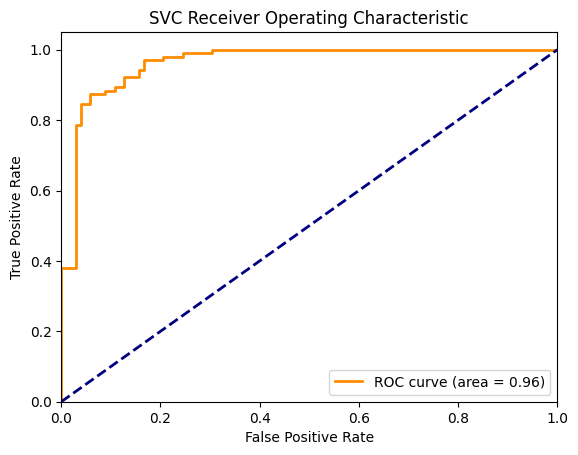

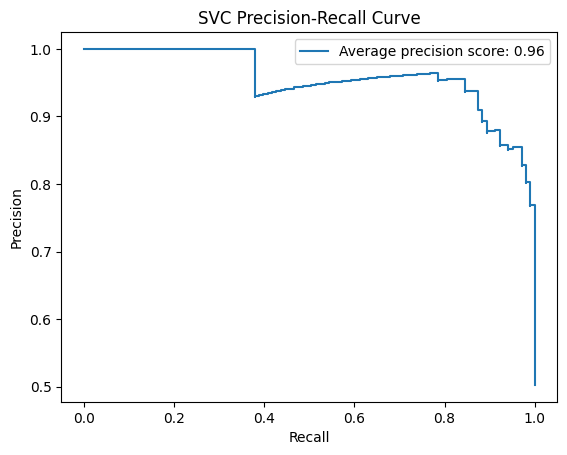

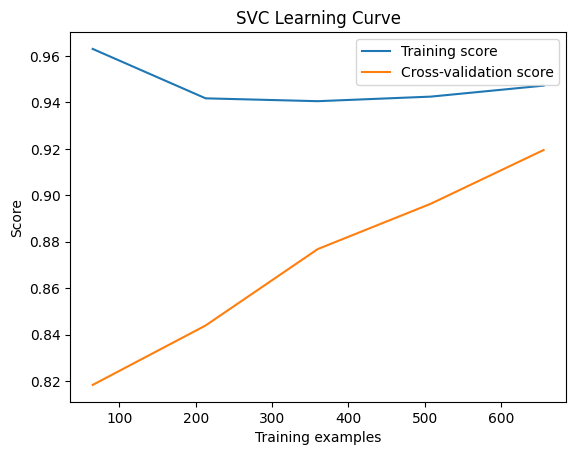

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Stacking Classifier Accuracy: 0.85
Stacking Classifier Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.70      0.82       102
           1       0.77      1.00      0.87       103

    accuracy                           0.85       205
   macro avg       0.88      0.85      0.85       205
weighted avg       0.88      0.85      0.85       205



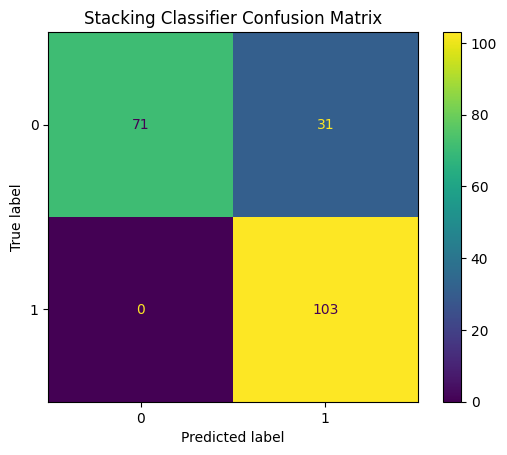

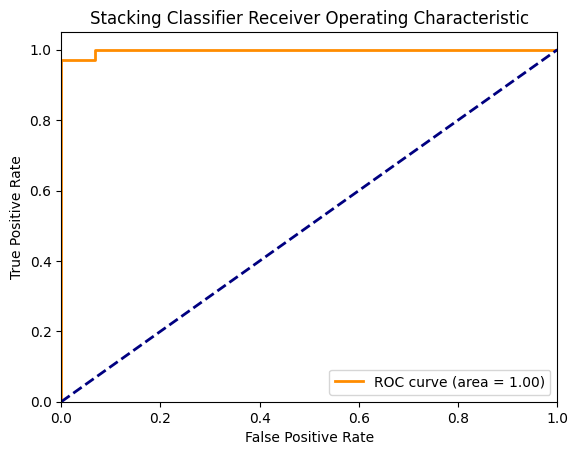

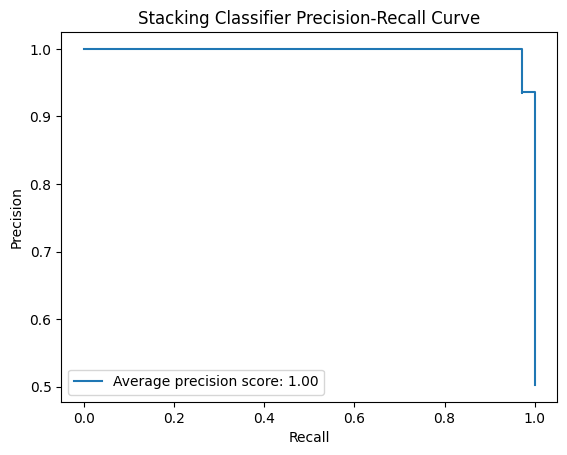

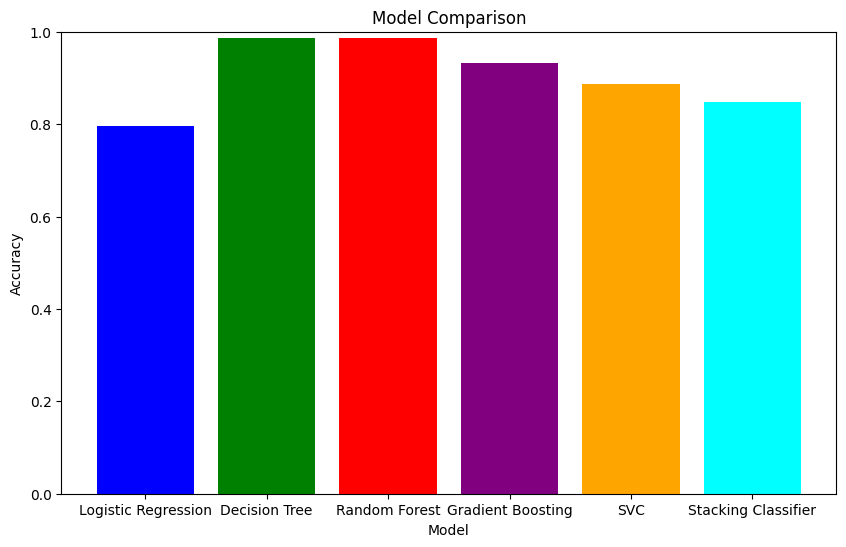

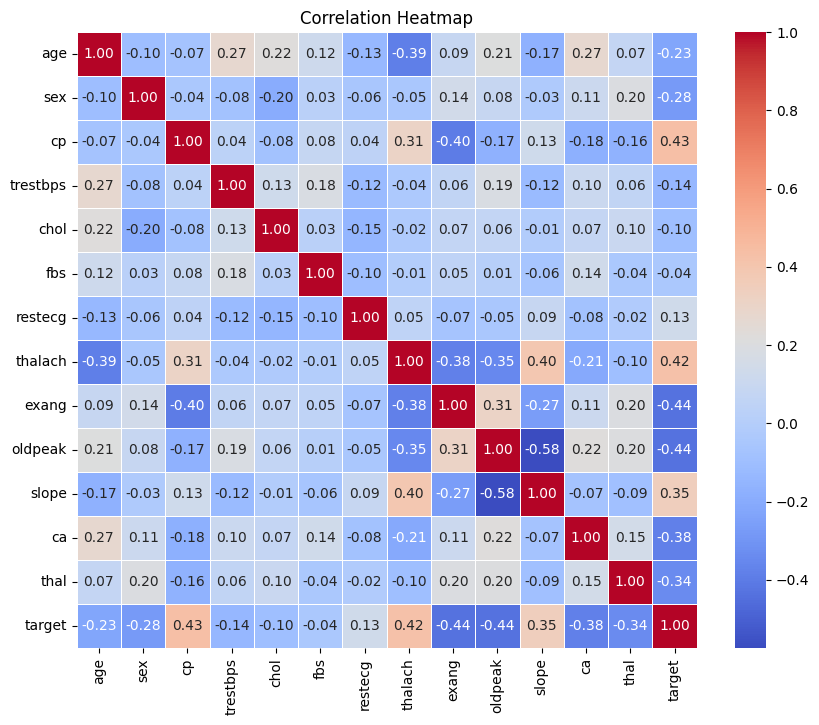

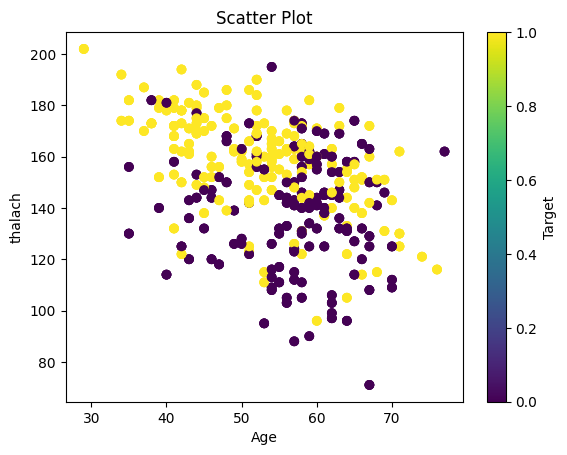

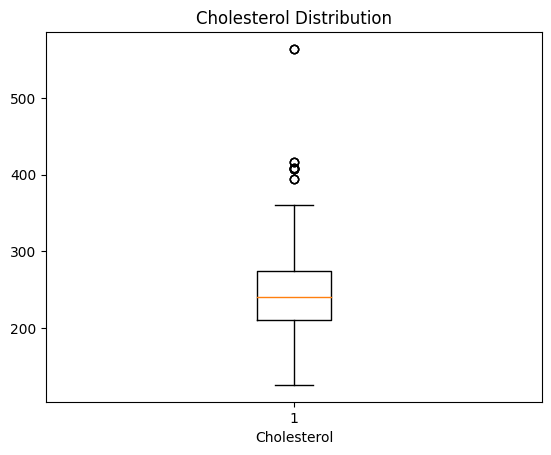

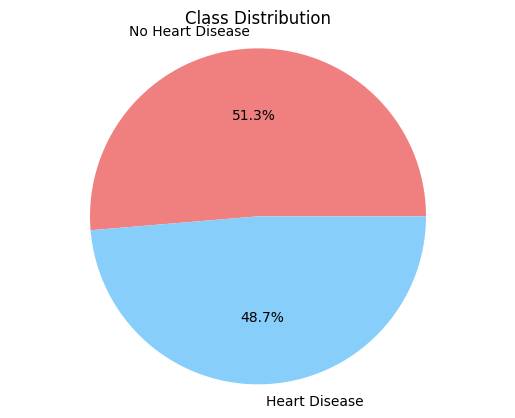

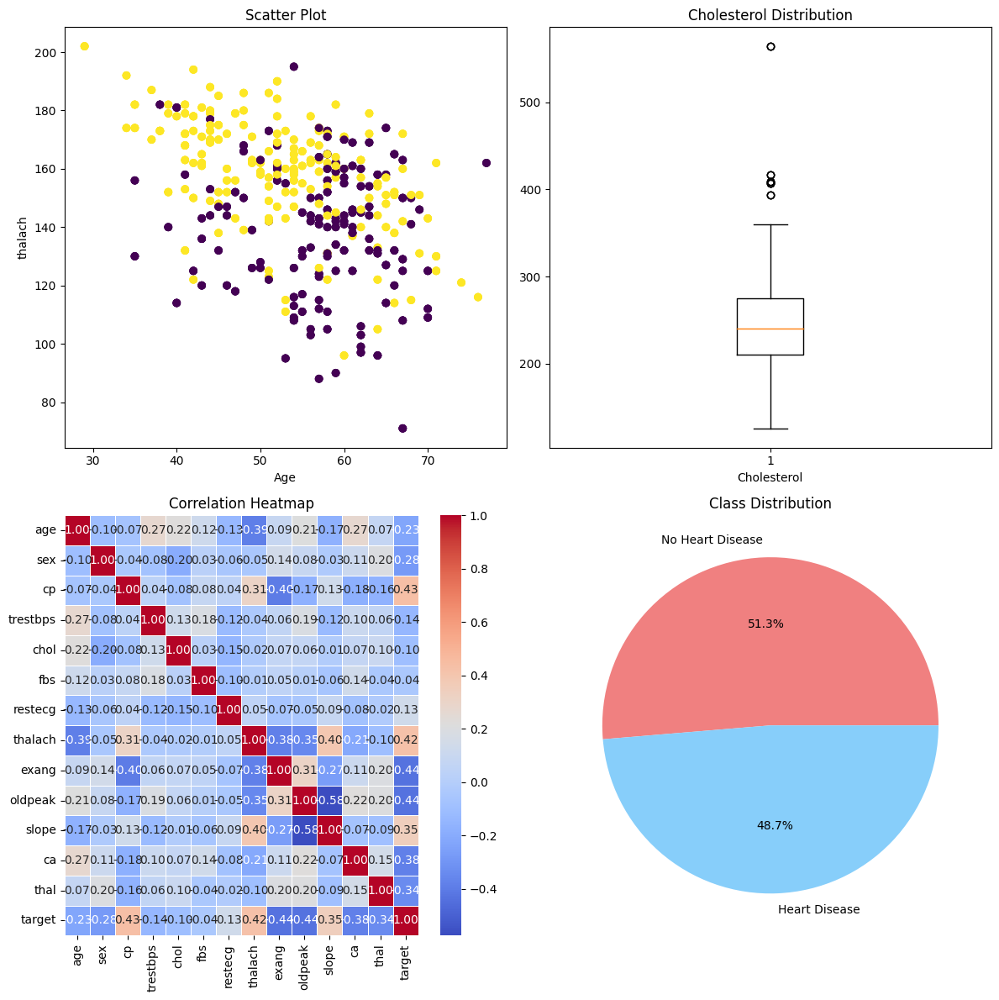

<ipython-input-2-a1809abfe87b>:245: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(X['chol'], shade=True, color='b', label='Cholesterol KDE')


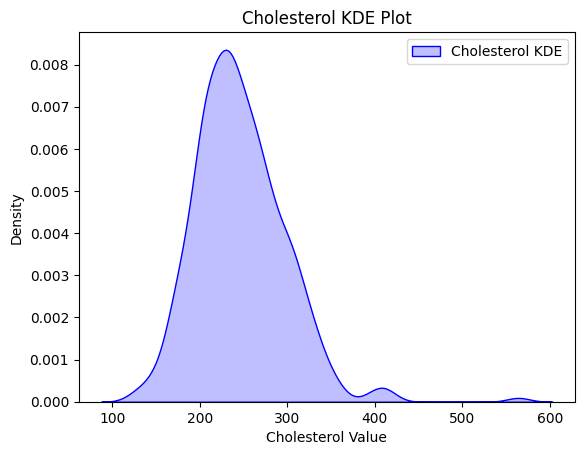

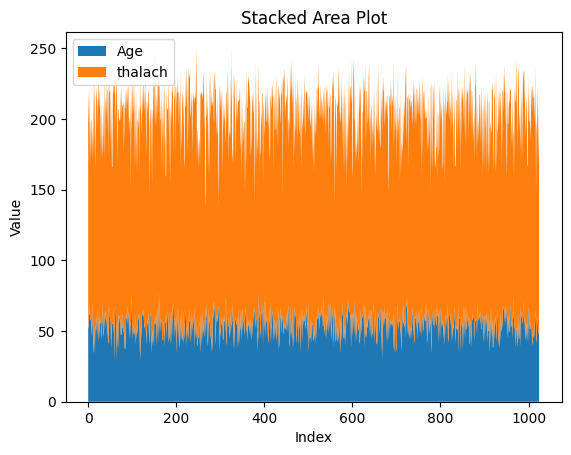

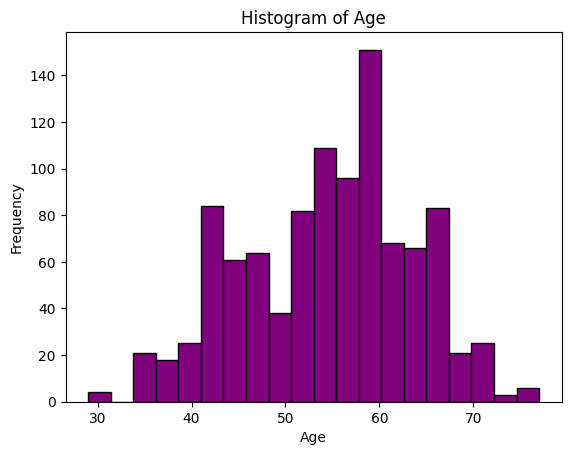

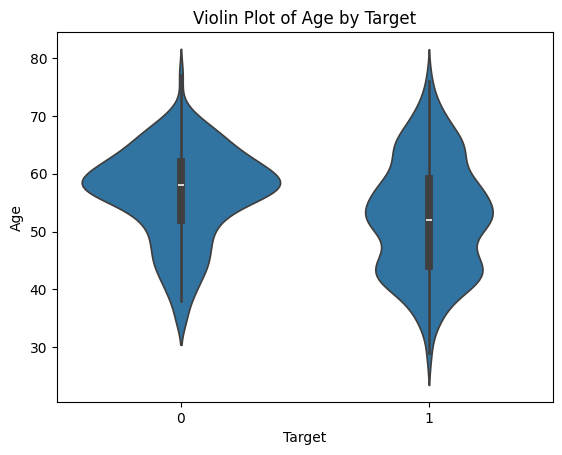

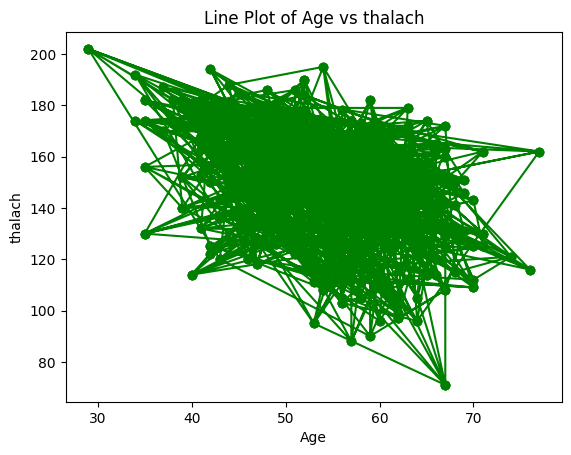

<Figure size 640x480 with 0 Axes>

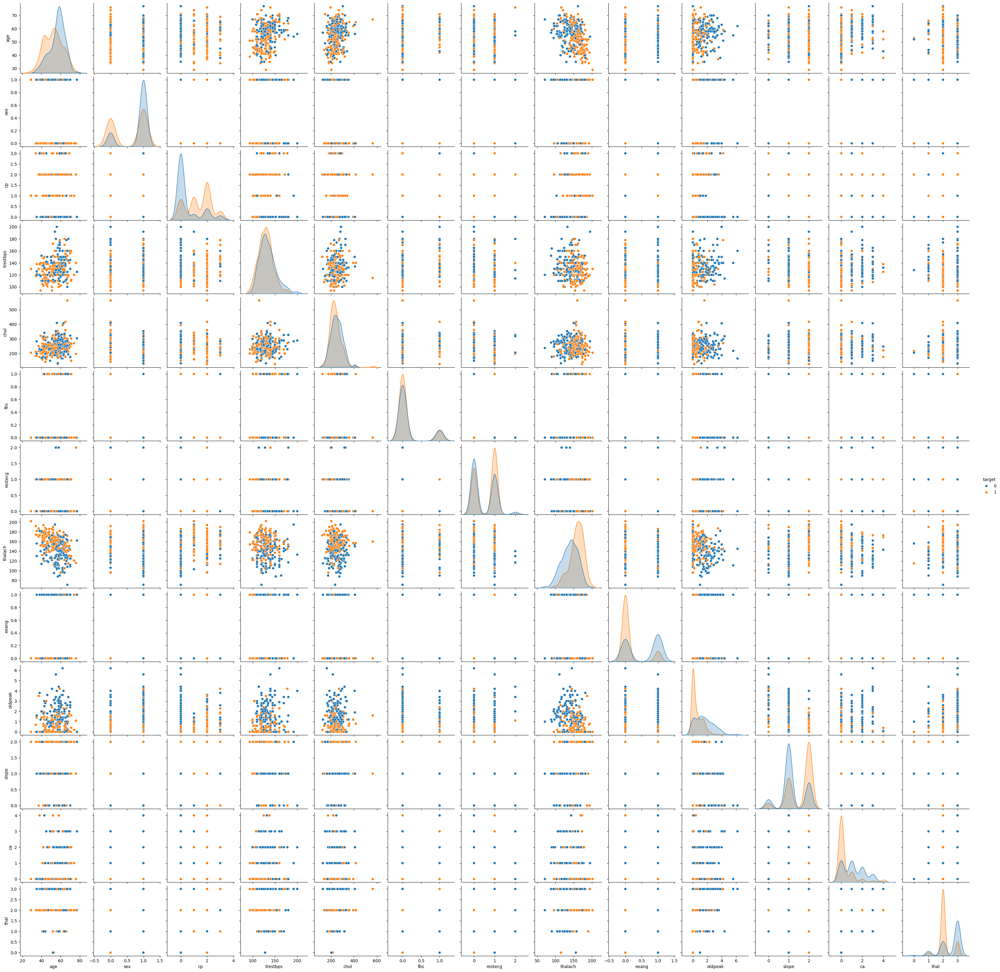

<Figure size 640x480 with 0 Axes>

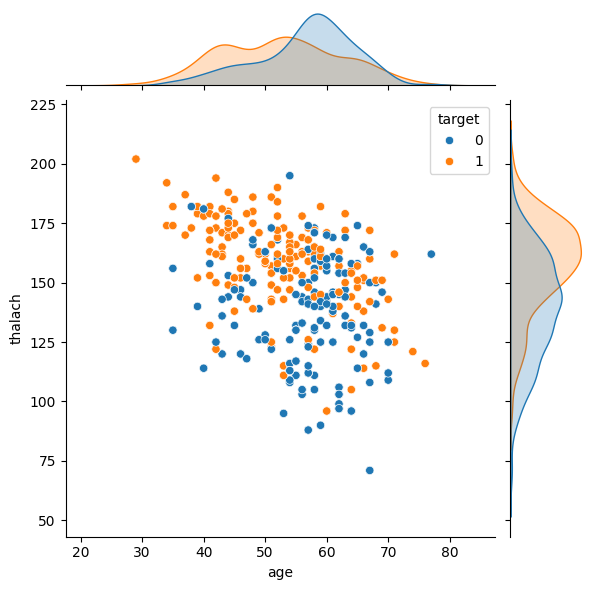

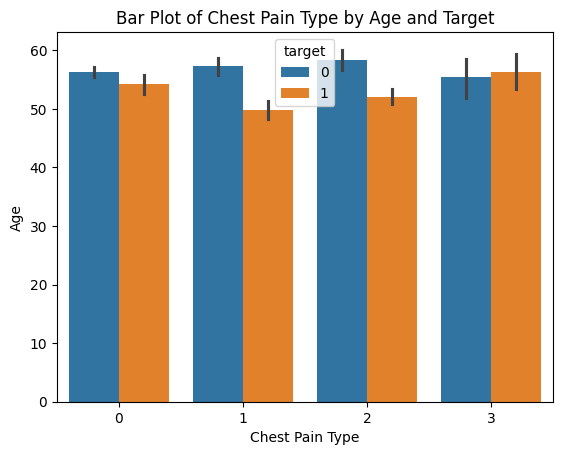

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 19.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 25.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


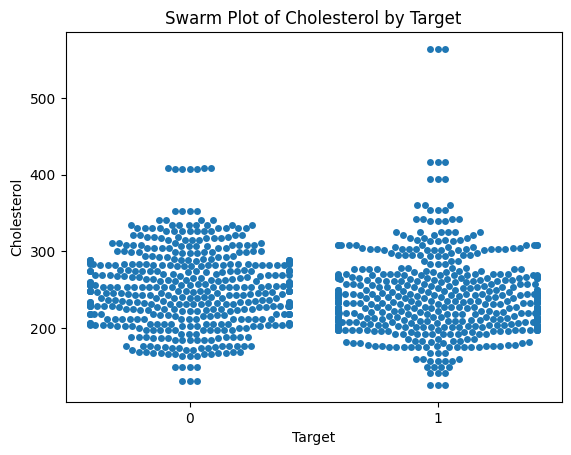

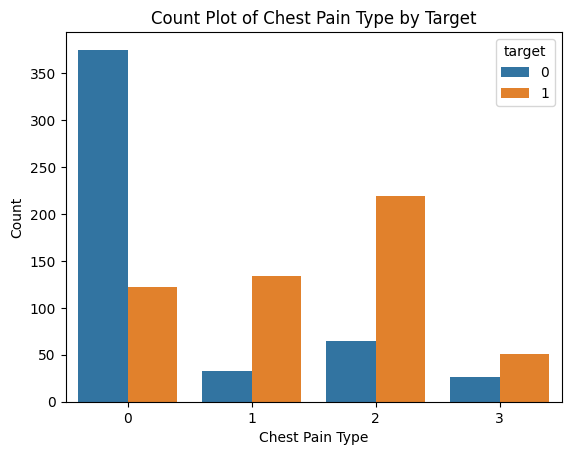

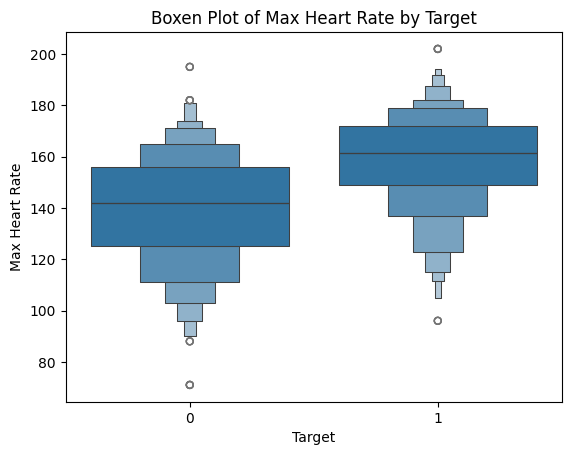

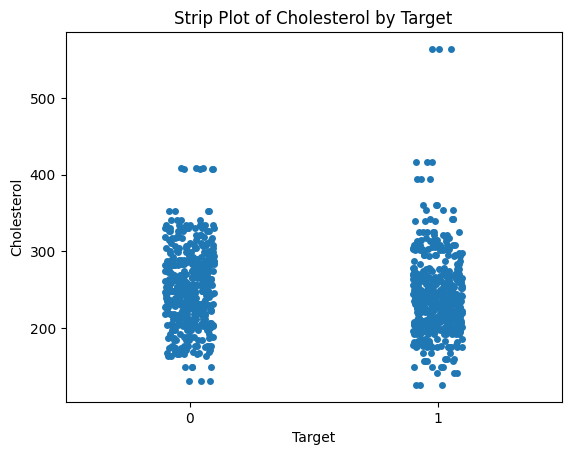

<ipython-input-2-a1809abfe87b>:354: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])


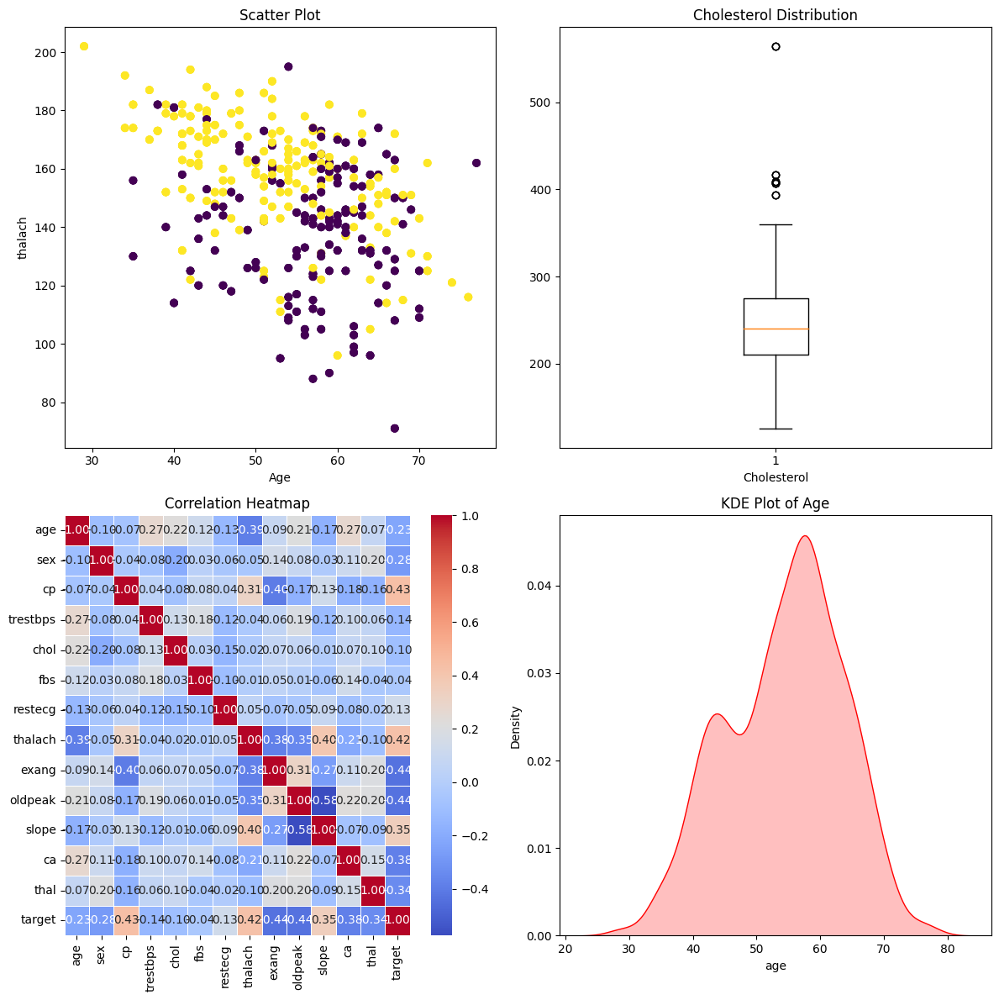

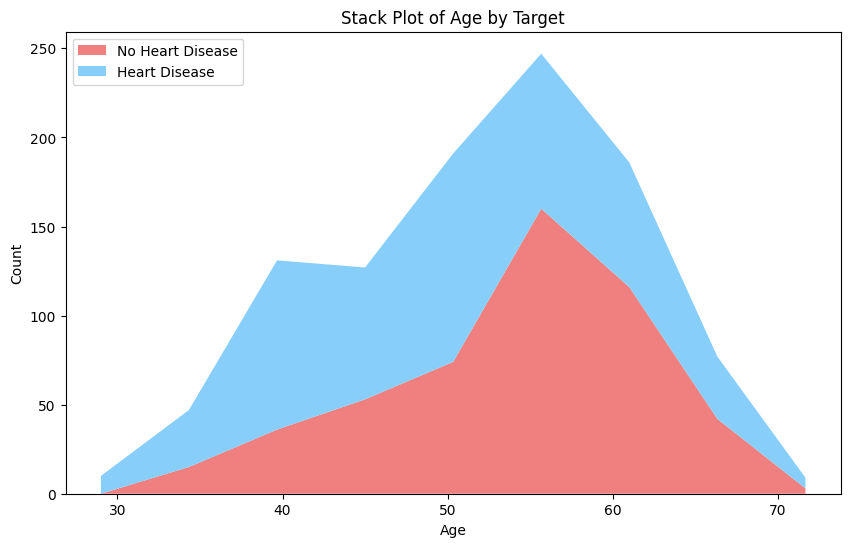

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_predict, learning_curve, validation_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report

# Load the dataset
data = pd.read_csv('/content/heart.csv')

# Select relevant columns
columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
data = data[columns]

# Handle missing values if any (for simplicity, we'll drop rows with missing values)
data = data.dropna()

# Split the data into features (X) and target (y)
X = data.drop('target', axis=1)
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define base learners
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'SVC': SVC(probability=True)
}

# Train and evaluate each model individually
individual_accuracies = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    individual_accuracies[name] = accuracy
    print(f'{name} Accuracy: {accuracy:.2f}')
    # Classification report
    print(f'{name} Classification Report:')
    print(classification_report(y_test, y_pred))
    # Plot confusion matrix
    disp = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)
    disp.ax_.set_title(f'{name} Confusion Matrix')
    plt.show()

    # Plot ROC curve
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{name} Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    # Plot Precision-Recall curve
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    average_precision = average_precision_score(y_test, y_prob)
    plt.figure()
    plt.step(recall, precision, where='post', label=f'Average precision score: {average_precision:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{name} Precision-Recall Curve')
    plt.legend(loc='best')
    plt.show()

    # Plot Learning Curve
    train_sizes, train_scores, test_scores = learning_curve(model, X_train, y_train, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 5))
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    plt.figure()
    plt.plot(train_sizes, train_scores_mean, label='Training score')
    plt.plot(train_sizes, test_scores_mean, label='Cross-validation score')
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    plt.title(f'{name} Learning Curve')
    plt.legend(loc='best')
    plt.show()

    # Plot Validation Curve (for a selected hyperparameter)
    if name == 'Logistic Regression':
        param_range = np.logspace(-3, 3, 7)
        train_scores, test_scores = validation_curve(model, X_train, y_train, param_name="C", param_range=param_range, cv=5, n_jobs=-1)
        plt.figure()
        plt.semilogx(param_range, np.mean(train_scores, axis=1), label='Training score')
        plt.semilogx(param_range, np.mean(test_scores, axis=1), label='Cross-validation score')
        plt.xlabel('Parameter C')
        plt.ylabel('Score')
        plt.title(f'{name} Validation Curve')
        plt.legend(loc='best')
        plt.show()

    # Plot feature importance for tree-based models
    if name in ['Decision Tree', 'Random Forest', 'Gradient Boosting']:
        plt.figure()
        feature_importances = model.feature_importances_
        indices = np.argsort(feature_importances)[::-1]
        plt.bar(range(X.shape[1]), feature_importances[indices], align='center')
        plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
        plt.xlabel('Feature')
        plt.ylabel('Importance')
        plt.title(f'{name} Feature Importance')
        plt.show()

# Define meta-learner
meta_learner = LogisticRegression(max_iter=2)

# Build the stacking classifier
stacking_clf = StackingClassifier(estimators=[(name, model) for name, model in models.items()], final_estimator=meta_learner)

# Train the model
stacking_clf.fit(X_train, y_train)

# Evaluate the model
y_pred = stacking_clf.predict(X_test)
stacking_accuracy = accuracy_score(y_test, y_pred)
print(f'Stacking Classifier Accuracy: {stacking_accuracy:.2f}')

# Classification report for stacking classifier
print('Stacking Classifier Classification Report:')
print(classification_report(y_test, y_pred))

# Plot confusion matrix for stacking classifier
disp = ConfusionMatrixDisplay.from_estimator(stacking_clf, X_test, y_test)
disp.ax_.set_title('Stacking Classifier Confusion Matrix')
plt.show()

# Plot ROC curve for stacking classifier
y_prob = stacking_clf.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Stacking Classifier Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Plot Precision-Recall curve for stacking classifier
precision, recall, _ = precision_recall_curve(y_test, y_prob)
average_precision = average_precision_score(y_test, y_prob)
plt.figure()
plt.step(recall, precision, where='post', label=f'Average precision score: {average_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Stacking Classifier Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Comparison plot of accuracies
model_names = list(individual_accuracies.keys()) + ['Stacking Classifier']
accuracies = list(individual_accuracies.values()) + [stacking_accuracy]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple', 'orange', 'cyan'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Comparison')
plt.ylim(0, 1)
plt.show()

# Additional Plots

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# Scatter Plot
plt.figure()
plt.scatter(X['age'], X['thalach'], c=y, cmap='viridis')
plt.xlabel('Age')
plt.ylabel('thalach')
plt.title('Scatter Plot')
plt.colorbar(label='Target')
plt.show()

# Box Plot
plt.figure()
plt.boxplot(X['chol'])
plt.xlabel('Cholesterol')
plt.title('Cholesterol Distribution')
plt.show()

# Pie Chart
plt.figure()
plt.pie(y.value_counts(), labels=['No Heart Disease', 'Heart Disease'], autopct='%1.1f%%', colors=['lightcoral', 'lightskyblue'])
plt.title('Class Distribution')
plt.axis('equal')
plt.show()

# Grid Plot
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Scatter Plot
axs[0, 0].scatter(X['age'], X['thalach'], c=y, cmap='viridis')
axs[0, 0].set_xlabel('Age')
axs[0, 0].set_ylabel('thalach')
axs[0, 0].set_title('Scatter Plot')

# Box Plot
axs[0, 1].boxplot(X['chol'])
axs[0, 1].set_xlabel('Cholesterol')
axs[0, 1].set_title('Cholesterol Distribution')

# Heatmap
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap')

# Pie Chart
axs[1, 1].pie(y.value_counts(), labels=['No Heart Disease', 'Heart Disease'], autopct='%1.1f%%', colors=['lightcoral', 'lightskyblue'])
axs[1, 1].set_title('Class Distribution')

plt.tight_layout()
plt.show()

# KDE Plot
plt.figure()
sns.kdeplot(X['chol'], shade=True, color='b', label='Cholesterol KDE')
plt.xlabel('Cholesterol Value')
plt.ylabel('Density')
plt.title('Cholesterol KDE Plot')
plt.legend()
plt.show()

# Stacked Area Plot (example, adjust as per your data)
plt.figure()
plt.stackplot(range(len(data)), data['age'], data['thalach'], labels=['Age', 'thalach'])
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Stacked Area Plot')
plt.legend(loc='upper left')
plt.show()

# Histogram
plt.figure()
plt.hist(X['age'], bins=20, color='purple', edgecolor='black')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Histogram of Age')
plt.show()

# Violin Plot
plt.figure()
sns.violinplot(x='target', y='age', data=data)
plt.xlabel('Target')
plt.ylabel('Age')
plt.title('Violin Plot of Age by Target')
plt.show()

# Line Plot
plt.figure()
plt.plot(X['age'], X['thalach'], linestyle='-', marker='o', color='green')
plt.xlabel('Age')
plt.ylabel('thalach')
plt.title('Line Plot of Age vs thalach')
plt.show()

# Pair Plot
plt.figure()
sns.pairplot(data, hue='target')
plt.show()

# Joint Plot
plt.figure()
sns.jointplot(x='age', y='thalach', data=data, kind='scatter', hue='target')
plt.show()

# Bar Plot
plt.figure()
sns.barplot(x='cp', y='age', hue='target', data=data)
plt.title('Bar Plot of Chest Pain Type by Age and Target')
plt.xlabel('Chest Pain Type')
plt.ylabel('Age')
plt.show()

# Swarm Plot
plt.figure()
sns.swarmplot(x='target', y='chol', data=data)
plt.title('Swarm Plot of Cholesterol by Target')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.show()

# Count Plot
plt.figure()
sns.countplot(x='cp', hue='target', data=data)
plt.title('Count Plot of Chest Pain Type by Target')
plt.xlabel('Chest Pain Type')
plt.ylabel('Count')
plt.show()

# Boxen Plot
plt.figure()
sns.boxenplot(x='target', y='thalach', data=data)
plt.title('Boxen Plot of Max Heart Rate by Target')
plt.xlabel('Target')
plt.ylabel('Max Heart Rate')
plt.show()

# Strip Plot
plt.figure()
sns.stripplot(x='target', y='chol', data=data, jitter=True)
plt.title('Strip Plot of Cholesterol by Target')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.show()

# Grid Plot
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Scatter Plot
axs[0, 0].scatter(data['age'], data['thalach'], c=data['target'], cmap='viridis')
axs[0, 0].set_xlabel('Age')
axs[0, 0].set_ylabel('thalach')
axs[0, 0].set_title('Scatter Plot')

# Box Plot
axs[0, 1].boxplot(data['chol'])
axs[0, 1].set_xlabel('Cholesterol')
axs[0, 1].set_title('Cholesterol Distribution')

# Heatmap
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap')

# KDE Plot
sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])
axs[1, 1].set_title('KDE Plot of Age')

plt.tight_layout()
plt.show()

# Stack Plot (using binned data)
age_bins = np.linspace(data['age'].min(), data['age'].max(), 10)
no_disease_counts, _ = np.histogram(data[data['target'] == 0]['age'], bins=age_bins)
disease_counts, _ = np.histogram(data[data['target'] == 1]['age'], bins=age_bins)

plt.figure(figsize=(10, 6))
plt.stackplot(age_bins[:-1], no_disease_counts, disease_counts, labels=['No Heart Disease', 'Heart Disease'], colors=['lightcoral', 'lightskyblue'])
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Stack Plot of Age by Target')
plt.legend(loc='upper left')
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Final Accuracy: 0.88
Stacked Model Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.85      0.87       102
           1       0.86      0.90      0.88       103

    accuracy                           0.88       205
   macro avg       0.88      0.88      0.88       205
weighted avg       0.88      0.88      0.88       205



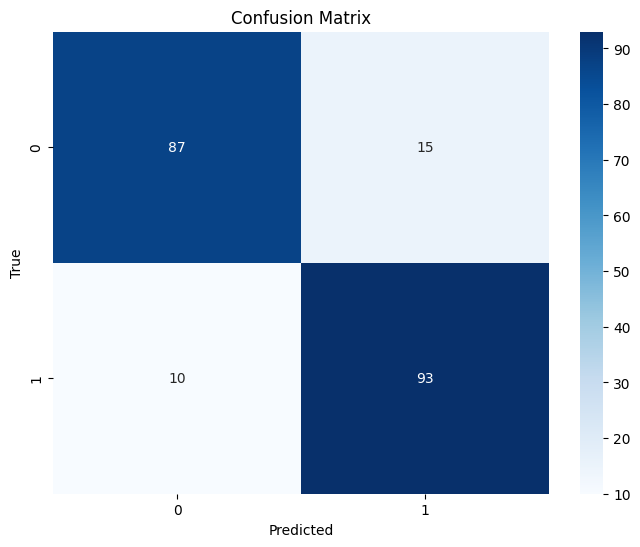

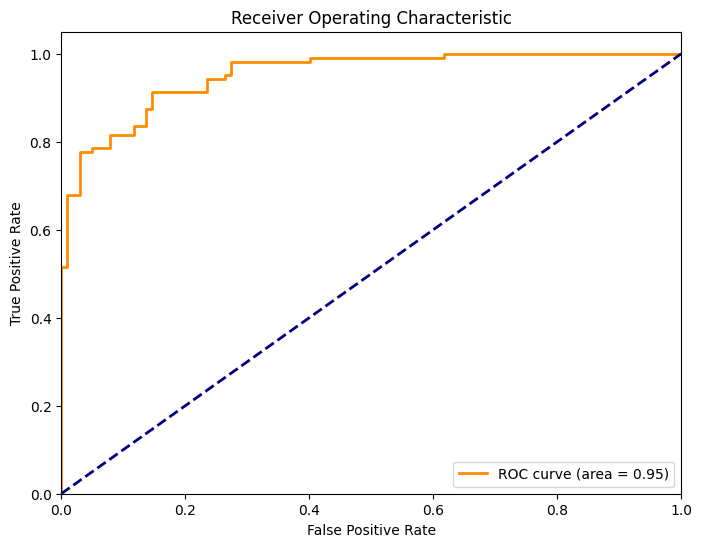

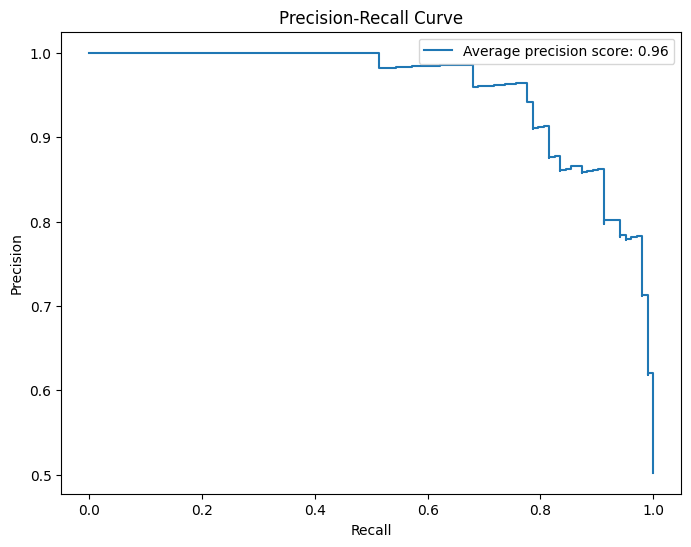

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


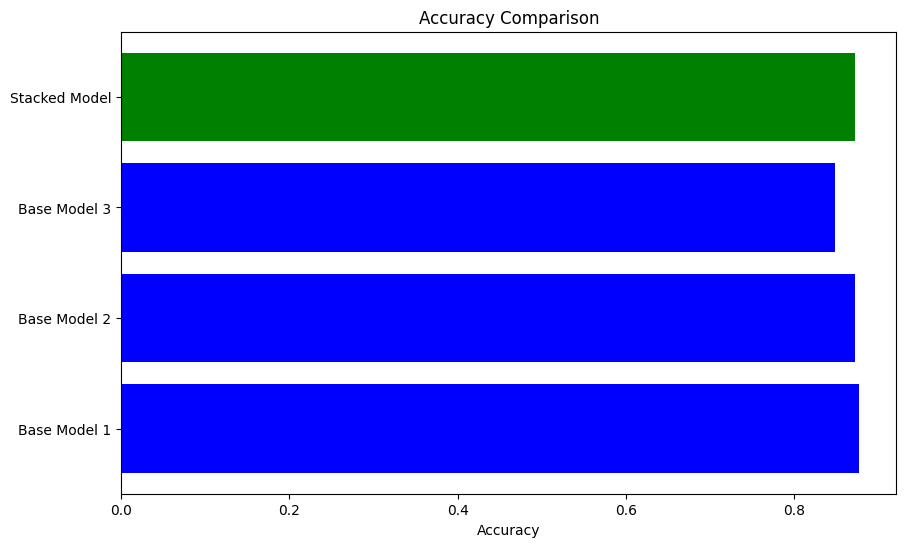

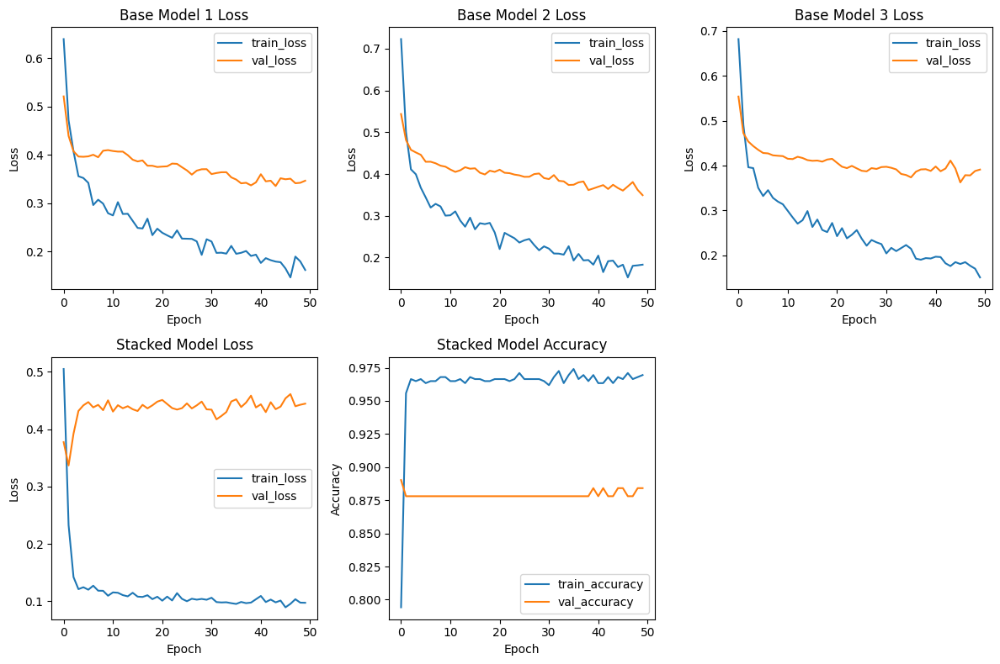

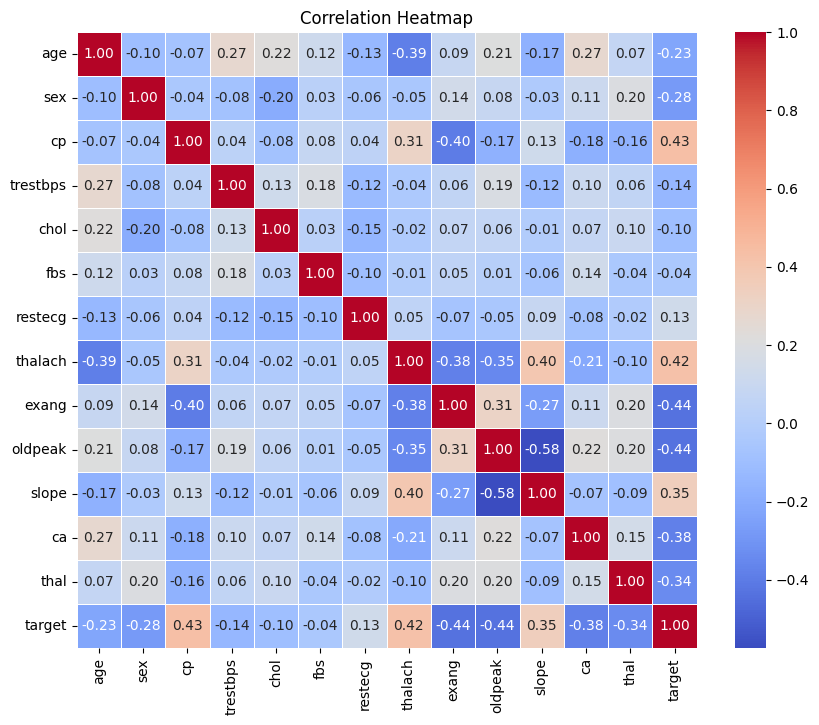

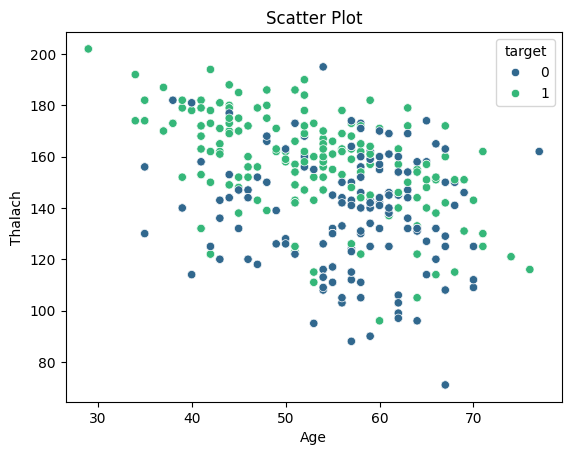

<ipython-input-5-1f7c02aaca2e>:181: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['target'], y=data['chol'], palette='muted')


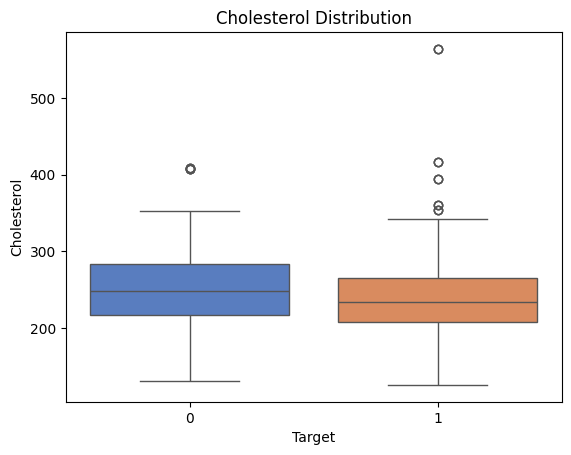

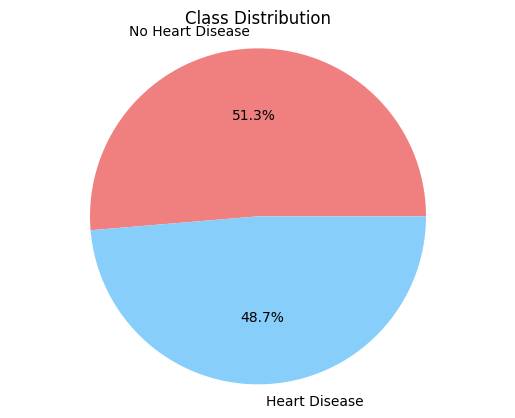

<ipython-input-5-1f7c02aaca2e>:204: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['target'], y=data['chol'], palette='muted', ax=axs[0, 1])
<ipython-input-5-1f7c02aaca2e>:214: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])


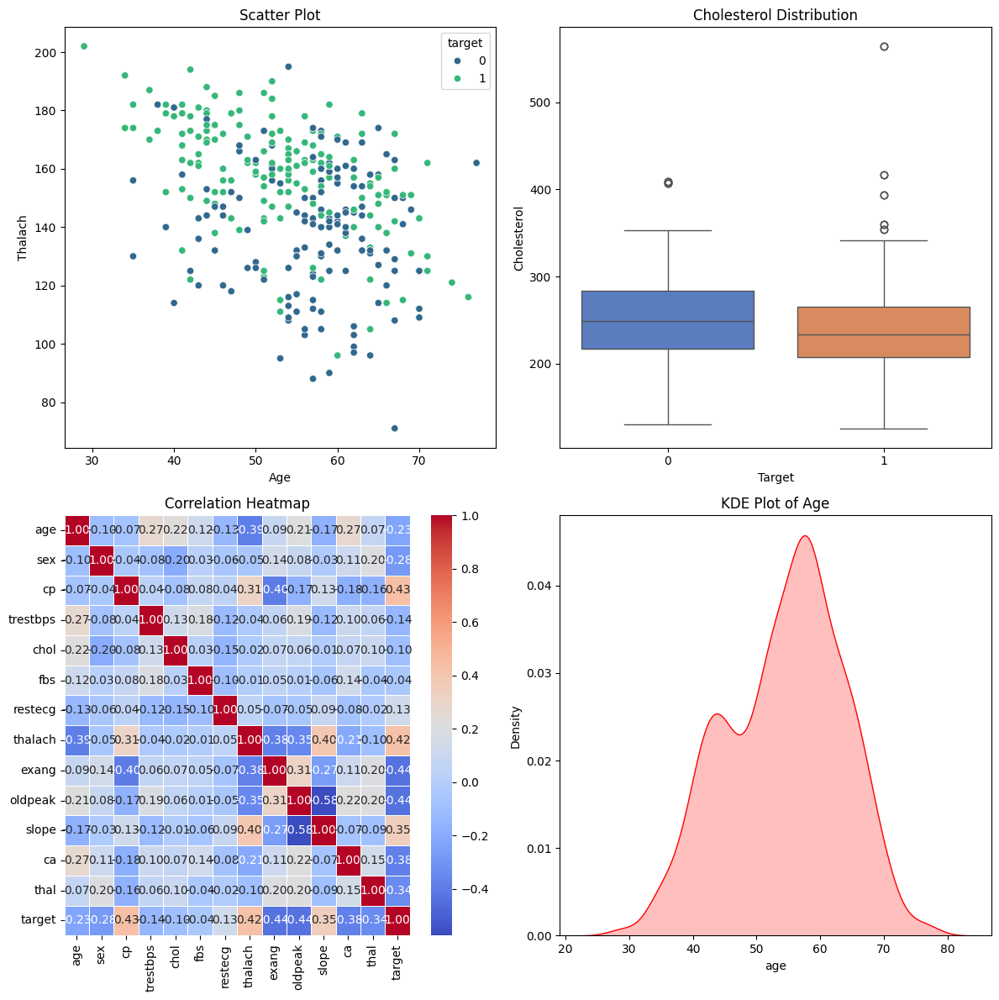

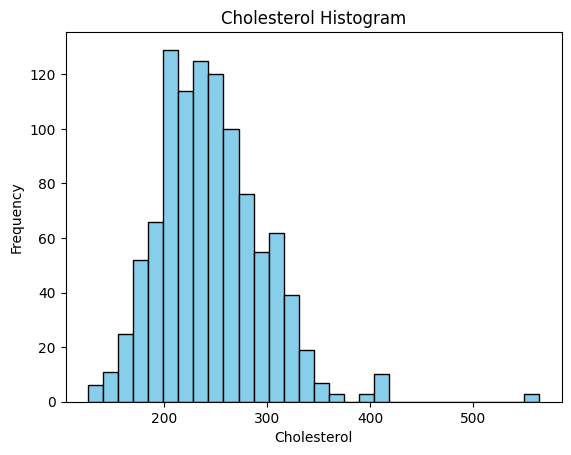

<ipython-input-5-1f7c02aaca2e>:232: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=data['target'], y=data['chol'], palette='muted')  # Cholesterol by Target


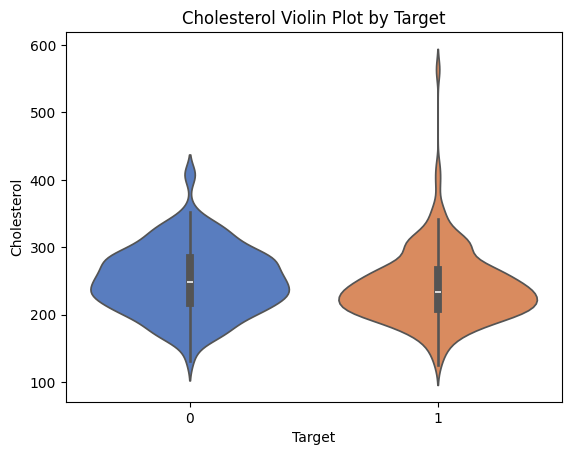

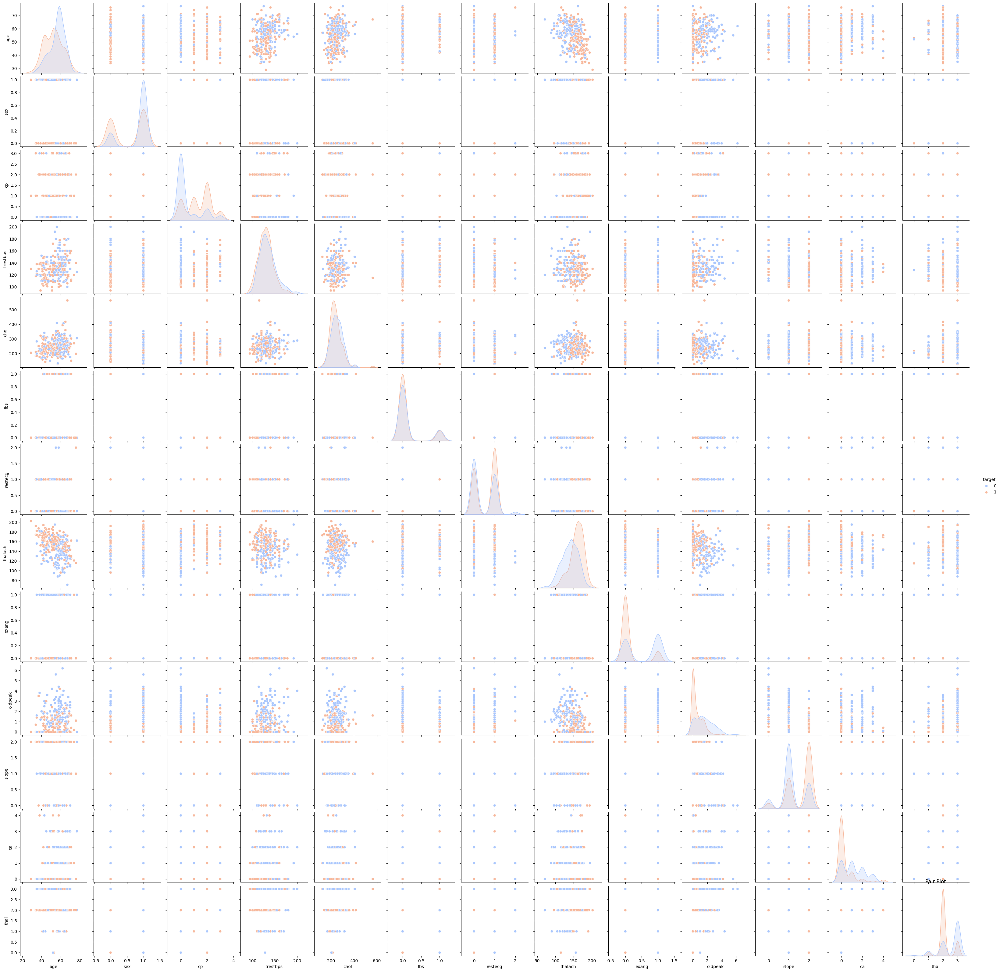

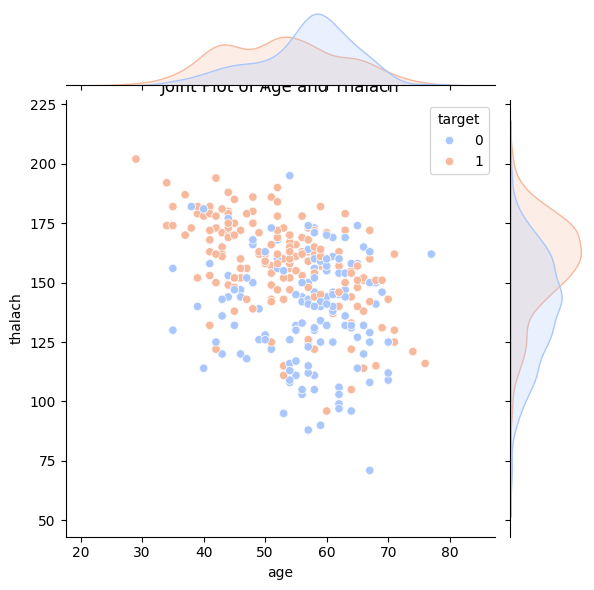

<ipython-input-5-1f7c02aaca2e>:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(x='target', y='chol', data=data, palette='muted')
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 19.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 25.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


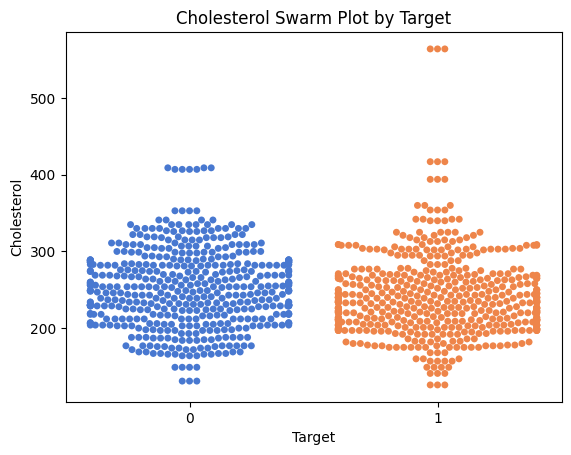

<ipython-input-5-1f7c02aaca2e>:258: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(x='target', y='chol', data=data, palette='pastel')


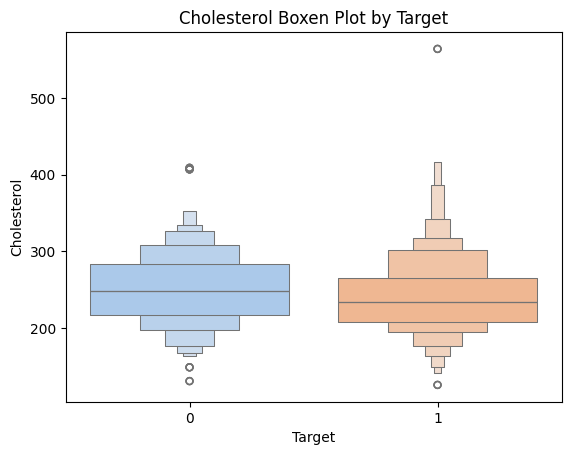

<ipython-input-5-1f7c02aaca2e>:266: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='target', y='chol', data=data, palette='pastel', jitter=True)


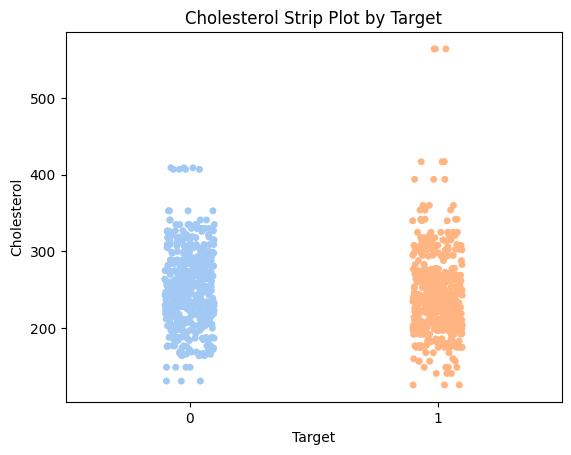

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report

# Load the dataset
data = pd.read_csv('/content/heart.csv')

# Select relevant columns
columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
data = data[columns]

# Handle missing values if any (for simplicity, we'll drop rows with missing values)
data = data.dropna()

# Split the data into features (X) and target (y)
X = data.drop('target', axis=1)
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert labels to categorical one-hot encoding
y_train_cat = to_categorical(y_train, num_classes=2)
y_test_cat = to_categorical(y_test, num_classes=2)

# Function to build base models
def build_base_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define base models
base_models = [build_base_model(X_train.shape[1]) for _ in range(3)]

# Train base models and get predictions for the second level
first_level_predictions_train = np.zeros((X_train.shape[0], len(base_models) * 2))  # 2 for each class
first_level_predictions_test = np.zeros((X_test.shape[0], len(base_models) * 2))

base_model_histories = []
for i, model in enumerate(base_models):
    history = model.fit(X_train, y_train_cat, epochs=50, batch_size=32, verbose=0, validation_split=0.2)
    base_model_histories.append(history)
    first_level_predictions_train[:, 2*i:2*i+2] = model.predict(X_train)
    first_level_predictions_test[:, 2*i:2*i+2] = model.predict(X_test)

# Function to build second level model
def build_second_level_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define and train the second level model
second_level_model = build_second_level_model(first_level_predictions_train.shape[1])
second_level_history = second_level_model.fit(first_level_predictions_train, y_train_cat, epochs=50, batch_size=32, verbose=0, validation_split=0.2)

# Evaluate the model
final_predictions = second_level_model.predict(first_level_predictions_test)
final_accuracy = accuracy_score(np.argmax(y_test_cat, axis=1), np.argmax(final_predictions, axis=1))
print(f'Final Accuracy: {final_accuracy:.2f}')

# Classification report for stacked model
print('Stacked Model Classification Report:')
print(classification_report(np.argmax(y_test_cat, axis=1), np.argmax(final_predictions, axis=1)))

# Confusion Matrix
cm = confusion_matrix(np.argmax(y_test_cat, axis=1), np.argmax(final_predictions, axis=1))
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(np.argmax(y_test_cat, axis=1), final_predictions[:, 1])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(np.argmax(y_test_cat, axis=1), final_predictions[:, 1])
average_precision = average_precision_score(np.argmax(y_test_cat, axis=1), final_predictions[:, 1])
plt.figure(figsize=(8, 6))
plt.step(recall, precision, where='post', label=f'Average precision score: {average_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Accuracy Comparison Plot
base_accuracies = [accuracy_score(np.argmax(y_test_cat, axis=1), np.argmax(model.predict(X_test), axis=1)) for model in base_models]
base_names = ['Base Model 1', 'Base Model 2', 'Base Model 3']
all_accuracies = base_accuracies + [final_accuracy]
all_names = base_names + ['Stacked Model']

plt.figure(figsize=(10, 6))
plt.barh(all_names, all_accuracies, color=['blue', 'blue', 'blue', 'green'])
plt.xlabel('Accuracy')
plt.title('Accuracy Comparison')
plt.show()

# Loss and Accuracy Curves during Training
plt.figure(figsize=(12, 8))
for i, history in enumerate(base_model_histories):
    plt.subplot(2, 3, i+1)
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.title(f'Base Model {i+1} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

plt.subplot(2, 3, 4)
plt.plot(second_level_history.history['loss'], label='train_loss')
plt.plot(second_level_history.history['val_loss'], label='val_loss')
plt.title('Stacked Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 3, 5)
plt.plot(second_level_history.history['accuracy'], label='train_accuracy')
plt.plot(second_level_history.history['val_accuracy'], label='val_accuracy')
plt.title('Stacked Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Additional Plots

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

# Scatter Plot
plt.figure()
sns.scatterplot(x=data['age'], y=data['thalach'], hue=data['target'], palette='viridis')
plt.xlabel('Age')
plt.ylabel('Thalach')
plt.title('Scatter Plot')
plt.show()

# Box Plot
plt.figure()
sns.boxplot(x=data['target'], y=data['chol'], palette='muted')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.title('Cholesterol Distribution')
plt.show()

# Pie Chart
plt.figure()
plt.pie(data['target'].value_counts(), labels=['No Heart Disease', 'Heart Disease'], autopct='%1.1f%%', colors=['lightcoral', 'lightskyblue'])
plt.title('Class Distribution')
plt.axis('equal')
plt.show()

# Grid Plot
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Scatter Plot
sns.scatterplot(x=data['age'], y=data['thalach'], hue=data['target'], palette='viridis', ax=axs[0, 0])
axs[0, 0].set_xlabel('Age')
axs[0, 0].set_ylabel('Thalach')
axs[0, 0].set_title('Scatter Plot')

# Box Plot
sns.boxplot(x=data['target'], y=data['chol'], palette='muted', ax=axs[0, 1])
axs[0, 1].set_xlabel('Target')
axs[0, 1].set_ylabel('Cholesterol')
axs[0, 1].set_title('Cholesterol Distribution')

# Heatmap
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, ax=axs[1, 0])
axs[1, 0].set_title('Correlation Heatmap')

# KDE Plot
sns.kdeplot(data['age'], shade=True, color="r", ax=axs[1, 1])
axs[1, 1].set_title('KDE Plot of Age')

plt.tight_layout()
plt.show()

# Additional Plots

# Histogram
plt.figure()
plt.hist(data['chol'], bins=30, color='skyblue', edgecolor='black')  # Cholesterol
plt.xlabel('Cholesterol')
plt.ylabel('Frequency')
plt.title('Cholesterol Histogram')
plt.show()

# Violin Plot
plt.figure()
sns.violinplot(x=data['target'], y=data['chol'], palette='muted')  # Cholesterol by Target
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.title('Cholesterol Violin Plot by Target')
plt.show()

# Pair Plot
sns.pairplot(data, hue='target', palette='coolwarm')
plt.title('Pair Plot')
plt.show()

# Joint Plot
sns.jointplot(x='age', y='thalach', data=data, hue='target', palette='coolwarm', kind='scatter')
plt.title('Joint Plot of Age and Thalach')
plt.show()

# Swarm Plot
plt.figure()
sns.swarmplot(x='target', y='chol', data=data, palette='muted')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.title('Cholesterol Swarm Plot by Target')
plt.show()

# Boxen Plot
plt.figure()
sns.boxenplot(x='target', y='chol', data=data, palette='pastel')
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.title('Cholesterol Boxen Plot by Target')
plt.show()

# Strip Plot
plt.figure()
sns.stripplot(x='target', y='chol', data=data, palette='pastel', jitter=True)
plt.xlabel('Target')
plt.ylabel('Cholesterol')
plt.title('Cholesterol Strip Plot by Target')
plt.show()

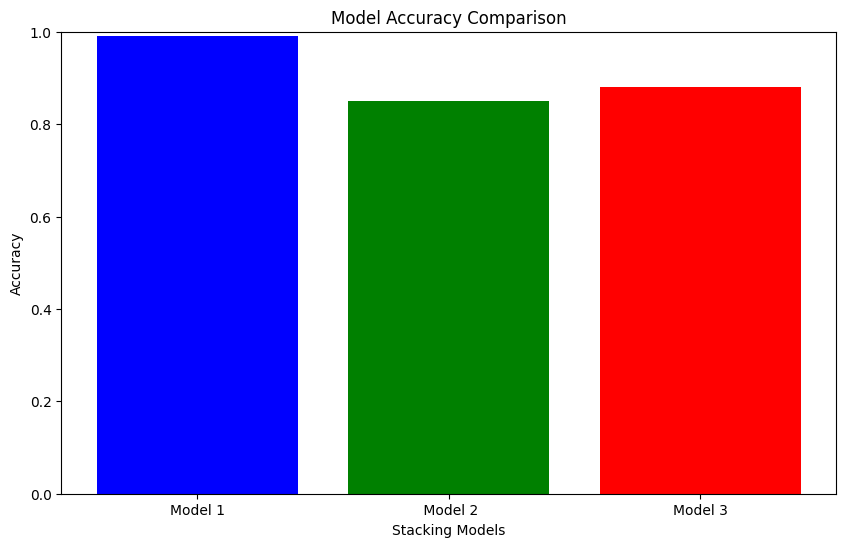

In [ ]:
import matplotlib.pyplot as plt

# Example values for demonstration; replace with your calculated accuracies
stacking_accuracy1 = 0.99
stacking_accuracy2 = 0.85
stacking_accuracy3 = 0.88

# Model names
models = ['Model 1', ' Model 2', 'Model 3']
accuracies = [stacking_accuracy1,stacking_accuracy2,stacking_accuracy3 ]

# Create bar plot
plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['blue', 'green', 'red'])
plt.xlabel('Stacking Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim([0, 1])  # Set y-axis limits for better visualization
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report

# Load the dataset
data = pd.read_csv('/content/heart_disease_health_indicators_BRFSS2015.csv')  # Ensure this path points to your dataset

# Select relevant columns
columns = ['HeartDiseaseorAttack', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke', 'Diabetes',
           'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost',
           'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income']
data = data[columns]

# Handle missing values if any (for simplicity, we'll drop rows with missing values)
data = data.dropna()

# Split the data into features (X) and target (y)
X = data.drop('HeartDiseaseorAttack', axis=1)
y = data['HeartDiseaseorAttack']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert labels to categorical one-hot encoding
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Function to build base models
def build_base_model(input_dim):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define base models
base_models = [build_base_model(X_train.shape[1]) for _ in range(3)]

# Train base models and get predictions for the second level
first_level_predictions_train = np.zeros((X_train.shape[0], len(base_models) * 2))  # 2 for each class
first_level_predictions_test = np.zeros((X_test.shape[0], len(base_models) * 2))

for i, model in enumerate(base_models):
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0, validation_split=0.2)
    first_level_predictions_train[:, 2*i:2*i+2] = model.predict(X_train)
    first_level_predictions_test[:, 2*i:2*i+2] = model.predict(X_test)

# Prepare the targets for second level
y_train_second_level = np.argmax(y_train, axis=1)
y_test_second_level = np.argmax(y_test, axis=1)

# Define and train the second level model (GBM)
second_level_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.2, max_depth=4, random_state=28)
second_level_model.fit(first_level_predictions_train, y_train_second_level)

# Evaluate the model
final_predictions = second_level_model.predict(first_level_predictions_test)
final_accuracy = accuracy_score(y_test_second_level, final_predictions)
print(f'Final Accuracy: {final_accuracy:.2f}')

# Classification Report
print('Classification Report:')
print(classification_report(y_test_second_level, final_predictions))

# # Confusion Matrix
# cm = confusion_matrix(y_test_second_level, final_predictions)
# plt.figure(figsize=(8, 6))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()

# # ROC Curve
# fpr, tpr, _ = roc_curve(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
# roc_auc = auc(fpr, tpr)
# plt.figure(figsize=(8, 6))
# plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic')
# plt.legend(loc="lower right")
# plt.show()

# # Precision-Recall Curve
# precision, recall, _ = precision_recall_curve(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
# average_precision = average_precision_score(y_test_second_level, second_level_model.predict_proba(first_level_predictions_test)[:, 1])
# plt.figure(figsize=(8, 6))
# plt.step(recall, precision, where='post', label=f'Average precision score: {average_precision:.2f}')
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.title('Precision-Recall Curve')
# plt.legend(loc='best')
# plt.show()

# # Accuracy Comparison Plot
# base_accuracies = [accuracy_score(np.argmax(y_test, axis=1), np.argmax(model.predict(X_test), axis=1)) for model in base_models]
# base_names = ['Base Model 1', 'Base Model 2', 'Base Model 3']
# all_accuracies = base_accuracies + [final_accuracy]
# all_names = base_names + ['Stacked Model']

# plt.figure(figsize=(10, 6))
# plt.barh(all_names, all_accuracies, color=['blue', 'blue', 'blue', 'green'])
# plt.xlabel('Accuracy')
# plt.title('Accuracy Comparison')
# plt.show()

# # Feature Importances (for Gradient Boosting Model)
# feature_importances = second_level_model.feature_importances_
# plt.figure(figsize=(10, 6))
# plt.barh(range(len(feature_importances)), feature_importances, align='center')
# plt.yticks(range(len(feature_importances)), ['Feature ' + str(i+1) for i in range(len(feature_importances))])
# plt.xlabel('Feature Importance')
# plt.title('Feature Importances from Gradient Boosting Model')
# plt.show()

# # Heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
# plt.title('Correlation Heatmap')
# plt.show()

# # Scatter Plot
# plt.figure()
# plt.scatter(data['Age'], data['BMI'], c=data['HeartDiseaseorAttack'], cmap='viridis')
# plt.xlabel('Age')
# plt.ylabel('BMI')
# plt.title('Scatter Plot')
# plt.colorbar(label='Heart Disease or Attack')
# plt.show()

# # Box Plot
# plt.figure()
# plt.boxplot(data['CholCheck'])
# plt.xlabel('Cholesterol Check')
# plt.title('Cholesterol Check Distribution')
# plt.show()

# # Pie Chart
# plt.figure()
# plt.pie(data['HeartDiseaseorAttack'].value_counts(), labels=['No Heart Disease', 'Heart Disease'], autopct='%1.1f%%', colors=['lightcoral', 'lightskyblue'])
# plt.title('Class Distribution')
# plt.axis('equal')
# plt.show()

# # KDE Plot
# plt.figure(figsize=(10, 6))
# sns.kdeplot(data['Age'], shade=True, color="r")
# plt.title('KDE Plot of Age')
# plt.xlabel('Age')
# plt.show()

# # Histogram
# plt.figure(figsize=(10, 6))
# plt.hist(data['BMI'], bins=20, color='purple', edgecolor='black')
# plt.title('Histogram of BMI')
# plt.xlabel('BMI')
# plt.ylabel('Frequency')
# plt.show()

# # Violin Plot
# plt.figure(figsize=(10, 6))
# sns.violinplot(x='HeartDiseaseorAttack', y='BMI', data=data)
# plt.title('Violin Plot of BMI by Heart Disease or Attack')
# plt.xlabel('Heart Disease or Attack')
# plt.ylabel('BMI')
# plt.show()

# # Line Plot (example: Age vs. BMI)
# plt.figure(figsize=(10, 6))
# plt.plot(data['Age'], data['BMI'], 'bo', linestyle='-', alpha=0.5)
# plt.title('Line Plot of Age vs. BMI')
# plt.xlabel('Age')
# plt.ylabel('BMI')
# plt.show()

# # Pair Plot
# sns.pairplot(data, hue='HeartDiseaseorAttack')
# plt.show()

# # Joint Plot
# sns.jointplot(x='Age', y='BMI', data=data, kind='scatter', hue='HeartDiseaseorAttack')
# plt.show()

# # Bar Plot
# plt.figure(figsize=(10, 6))
# sns.barplot(x='Sex', y='BMI', hue='HeartDiseaseorAttack', data=data)
# plt.title('Bar Plot of BMI by Sex and Heart Disease or Attack')
# plt.xlabel('Sex')
# plt.ylabel('BMI')
# plt.show()


1586/1586 [==============================] - 2s 1ms/step
Final Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.99      0.95     45968
           1       0.54      0.11      0.19      4768

    accuracy                           0.91     50736
   macro avg       0.73      0.55      0.57     50736
weighted avg       0.88      0.91      0.88     50736

